# **Installing the new libraries**

In [ ]:
pip install pandas numpy scikit-learn matplotlib seaborn

In [ ]:
pip install tensorflow keras

# **Imported and converted .dat files to .csv files**

In [ ]:
import pandas as pd
import os

# Define the column names based on the dataset description
columns = ['timestamp', 'activityID', 'heart_rate'] + \
          [f'IMU_hand_{i}' for i in range(1, 18)] + \
          [f'IMU_chest_{i}' for i in range(1, 18)] + \
          [f'IMU_ankle_{i}' for i in range(1, 18)]

data_dir = '/content/'  # Path in Colab where your .dat files are uploaded
output_dir = '/content/'  # Path in Colab where you want to save the CSV files

# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Loop through each file in the directory and convert it to CSV
for filename in os.listdir(data_dir):
    if filename.endswith('.dat'):
        file_path = os.path.join(data_dir, filename)

        # Read the .dat file into a DataFrame with flexible spacing
        # and ignore lines that don't match the expected number of columns
        data = pd.read_csv(file_path, sep='\s+', header=None, names=columns, on_bad_lines='skip')

        # Generate output CSV file path
        output_file = os.path.join(output_dir, filename.replace('.dat', '.csv'))

        # Save the DataFrame to a CSV file
        data.to_csv(output_file, index=False)

        print(f'Converted {filename} to {output_file}')

print("All .dat files have been converted to .csv files and saved in the output directory.")


Converted subject108.dat to /content/subject108.csv
Converted subject104.dat to /content/subject104.csv
Converted subject103.dat to /content/subject103.csv
Converted subject106.dat to /content/subject106.csv
Converted subject101.dat to /content/subject101.csv
Converted subject102.dat to /content/subject102.csv
Converted subject107.dat to /content/subject107.csv
Converted subject105.dat to /content/subject105.csv
Converted subject109.dat to /content/subject109.csv
All .dat files have been converted to .csv files and saved in the output directory.


# **combine all .csv files**

In [ ]:
import pandas as pd
import glob

# Combine all CSV files into one DataFrame
csv_files = glob.glob('/content/*.csv')  # Adjust path and file pattern to match CSV files

# Check if any CSV files were found
if not csv_files:
    print("No CSV files found in the directory.")
else:
    # Combine all CSV files into one DataFrame
    combined_data = pd.concat([pd.read_csv(file) for file in csv_files], ignore_index=True)

    # Save combined data to a new CSV file (optional)
    combined_data.to_csv('/content/combined_data.csv', index=False)
    print("CSV files combined and saved as 'combined_data.csv'.")


CSV files combined and saved as 'combined_data.csv'.


# **Checking for missing values**

Missing values summary:
heart_rate      101547
IMU_hand_1          41
IMU_hand_2          41
IMU_hand_3          41
IMU_hand_4          41
IMU_hand_5          41
IMU_hand_6          41
IMU_hand_7          41
IMU_hand_8          43
IMU_hand_9          43
IMU_hand_10         43
IMU_hand_11         44
IMU_hand_12         44
IMU_hand_13         44
IMU_hand_14         44
IMU_hand_15         44
IMU_hand_16         44
IMU_hand_17         44
IMU_chest_1        239
IMU_chest_2        239
IMU_chest_3        239
IMU_chest_4        239
IMU_chest_5        239
IMU_chest_6        239
IMU_chest_7        240
IMU_chest_8        240
IMU_chest_9        240
IMU_chest_10       241
IMU_chest_11       241
IMU_chest_12       241
IMU_chest_13       241
IMU_chest_14       242
IMU_chest_15       242
IMU_chest_16       243
IMU_chest_17       243
IMU_ankle_1         61
IMU_ankle_2         61
IMU_ankle_3         61
IMU_ankle_4         61
IMU_ankle_5         61
IMU_ankle_6         61
IMU_ankle_7         61
IMU_ankle_

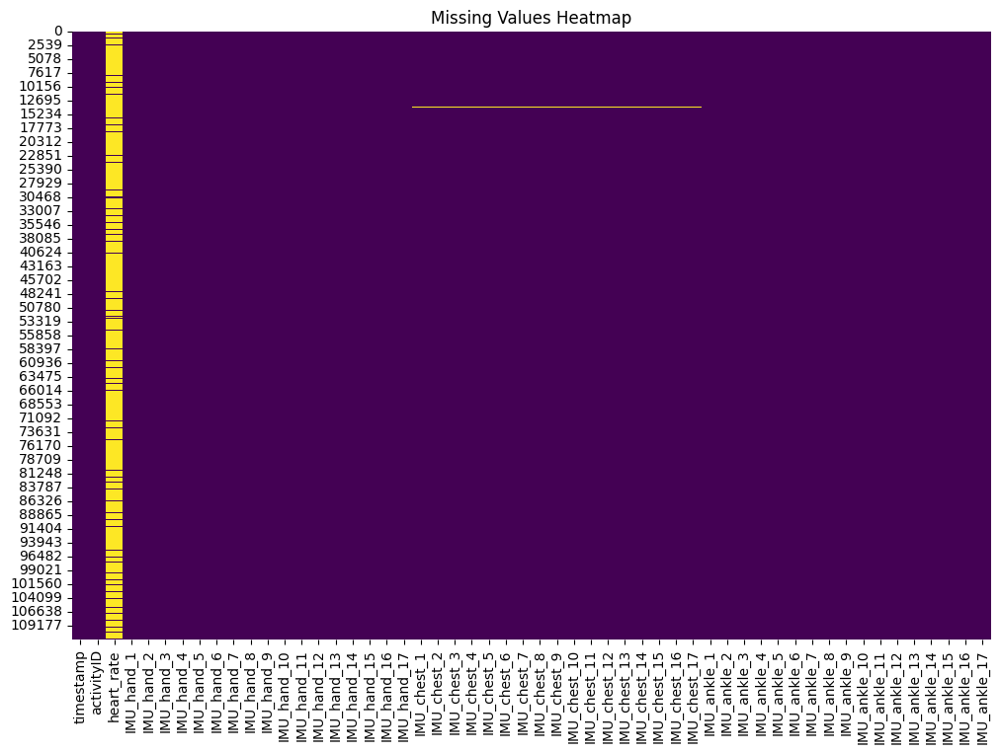

In [ ]:
# Load the combined data
data = pd.read_csv('/content/combined_data.csv')

# Check for missing values
missing_summary = data.isna().sum()
print("Missing values summary:")
print(missing_summary[missing_summary > 0])

# Visualize missing values
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(data.isna(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

# **Handling missing data**

Remove rows with missing values

In [ ]:
#data_cleaned = data.dropna()

finding missing values with mean median and mode

The warning below indicates: The warning message "Warning: No object columns found or all object columns have all missing values" indicates that your DataFrame either doesn't have any columns with the object data type (which usually represents strings or categorical data), or all the columns with the object data type have only missing values (NaN).

In [ ]:
# Fill missing values with the mean for numerical columns
#data_filled_mean = data.fillna(data.select_dtypes(include='number').mean())

# Or fill with median
#data_filled_median = data.fillna(data.select_dtypes(include='number').median())

# For categorical data, fill with mode
# Check if there are any object columns and if they have a mode
#object_mode = data.select_dtypes(include='object').mode()
#if not object_mode.empty:
#  data_filled_mode = data.fillna(object_mode.iloc[0])
#else:
  # Handle the case where there are no object columns or no mode
#  data_filled_mode = data.copy()
#  print("Warning: No object columns found or all object columns have all missing values.")

Interpolate missing values

In [ ]:
#data_interpolated = data.interpolate()

use of specific values

In [ ]:
#data_filled_value = data.fillna(0)  # Example value

In percentage


In [ ]:
# B. Handle Missing Values
# Calculate the percentage of missing values per column
missing_data_percentage = data.isnull().mean() * 100
print("Missing values (%):\n", missing_data_percentage)

Missing values (%):
 timestamp        0.000000
activityID       0.000000
heart_rate      90.904778
IMU_hand_1       0.036703
IMU_hand_2       0.036703
IMU_hand_3       0.036703
IMU_hand_4       0.036703
IMU_hand_5       0.036703
IMU_hand_6       0.036703
IMU_hand_7       0.036703
IMU_hand_8       0.038494
IMU_hand_9       0.038494
IMU_hand_10      0.038494
IMU_hand_11      0.039389
IMU_hand_12      0.039389
IMU_hand_13      0.039389
IMU_hand_14      0.039389
IMU_hand_15      0.039389
IMU_hand_16      0.039389
IMU_hand_17      0.039389
IMU_chest_1      0.213953
IMU_chest_2      0.213953
IMU_chest_3      0.213953
IMU_chest_4      0.213953
IMU_chest_5      0.213953
IMU_chest_6      0.213953
IMU_chest_7      0.214848
IMU_chest_8      0.214848
IMU_chest_9      0.214848
IMU_chest_10     0.215743
IMU_chest_11     0.215743
IMU_chest_12     0.215743
IMU_chest_13     0.215743
IMU_chest_14     0.216638
IMU_chest_15     0.216638
IMU_chest_16     0.217533
IMU_chest_17     0.217533
IMU_ankle_1      

In [ ]:
# Optionally interpolate missing values
data_interpolated = data.interpolate(method='linear', limit_direction='forward', axis=0)


# **Save the cleaned data**

In [ ]:
# Save the cleaned dataset
#data_cleaned.to_csv('/content/cleaned_data.csv', index=False)


# **feature engineering**

load the cleaned data

In [ ]:
data = pd.read_csv('/content/combined_data.csv')

feature extraction:
1. Statistical feature

In [ ]:
# Example for IMU hand data
imu_hand_features = data.filter(regex='IMU_hand').agg(['mean', 'std', 'min', 'max'])

2. Time based features

In [ ]:
# Example of rolling mean with a window size of 5
data['rolling_mean'] = data['IMU_hand_1'].rolling(window=5).mean()

3. Normalization and standardization


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
numerical_features = ['heart_rate'] + [f'IMU_hand_{i}' for i in range(1, 18)]
data[numerical_features] = scaler.fit_transform(data[numerical_features])

Labelling and coding

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
data['activityID'] = label_encoder.fit_transform(data['activityID'])

# **Mean value updation to combined.csv files**

In [ ]:
import pandas as pd

# Load the combined data
combined_data_path = '/content/combined_data.csv'
data = pd.read_csv(combined_data_path)

# Check the first few rows
print(data.head())

# Check for missing values
missing_summary = data.isna().sum()
print("Missing values summary:")
print(missing_summary[missing_summary > 0])

   timestamp  activityID  heart_rate  IMU_hand_1  IMU_hand_2  IMU_hand_3  \
0       5.64           0         NaN        33.0     2.79143     7.55389   
1       5.65           0         NaN        33.0     2.86086     7.43814   
2       5.66           0       100.0        33.0     2.80997     7.09430   
3       5.67           0         NaN        33.0     2.77138     6.98077   
4       5.68           0         NaN        33.0     2.76710     7.13119   

   IMU_hand_4  IMU_hand_5  IMU_hand_6  IMU_hand_7  ...  IMU_ankle_8  \
0    -7.06374     2.87553     7.88823    -6.76139  ...    -0.027148   
1    -7.21626     2.84248     7.63164    -6.85140  ...     0.012804   
2    -7.52376     2.79373     7.43545    -7.07744  ...    -0.001695   
3    -7.52396     2.80627     7.29929    -7.24326  ...     0.055437   
4    -7.67848     2.78766     7.11797    -7.48445  ...     0.017184   

   IMU_ankle_9  IMU_ankle_10  IMU_ankle_11  IMU_ankle_12  IMU_ankle_13  \
0    -0.031190     -0.040897      -47.7695

In [ ]:
# Save a duplicate with missing values intact
original_data_path = '/content/combined_with_missing_values.csv'
data.to_csv(original_data_path, index=False)
print(f'Duplicated original dataset saved at: {original_data_path}')

Duplicated original dataset saved at: /content/combined_with_missing_values.csv


In [ ]:
# Fill missing values with the mean for numerical columns
data_filled_mean = data.fillna(data.mean())

# Save the new file with imputed values
imputed_data_path = '/content/combined_with_imputed_mean.csv'
data_filled_mean.to_csv(imputed_data_path, index=False)

print(f'Imputed dataset saved at: {imputed_data_path}')

Imputed dataset saved at: /content/combined_with_imputed_mean.csv


In [ ]:
# Check if any missing values remain in the imputed dataset
missing_summary_after_imputation = data_filled_mean.isna().sum()
print("Missing values summary after imputation:")
print(missing_summary_after_imputation[missing_summary_after_imputation > 0])

# Display the first few rows of the imputed data
print(data_filled_mean.head())

Missing values summary after imputation:
Series([], dtype: int64)
   timestamp  activityID  heart_rate  IMU_hand_1  IMU_hand_2  IMU_hand_3  \
0       5.64           0   90.770608        33.0     2.79143     7.55389   
1       5.65           0   90.770608        33.0     2.86086     7.43814   
2       5.66           0  100.000000        33.0     2.80997     7.09430   
3       5.67           0   90.770608        33.0     2.77138     6.98077   
4       5.68           0   90.770608        33.0     2.76710     7.13119   

   IMU_hand_4  IMU_hand_5  IMU_hand_6  IMU_hand_7  ...  IMU_ankle_8  \
0    -7.06374     2.87553     7.88823    -6.76139  ...    -0.027148   
1    -7.21626     2.84248     7.63164    -6.85140  ...     0.012804   
2    -7.52376     2.79373     7.43545    -7.07744  ...    -0.001695   
3    -7.52396     2.80627     7.29929    -7.24326  ...     0.055437   
4    -7.67848     2.78766     7.11797    -7.48445  ...     0.017184   

   IMU_ankle_9  IMU_ankle_10  IMU_ankle_11  IMU_an

# **Cleaning and preprocessing the data**

In [ ]:
import pandas as pd
data = pd.read_csv('/content/combined_with_imputed_mean.csv')

In [ ]:
# Drop irrelevant columns (e.g., 'timestamp' if it doesn't contribute to prediction)
# Adjust this list based on your dataset's needs
irrelevant_columns = ['timestamp']
data_cleaned = data.drop(columns=irrelevant_columns)

In [ ]:
# Check for duplicates
duplicate_rows = data_cleaned.duplicated().sum()
print(f'Number of duplicate rows: {duplicate_rows}')

# If there are duplicates, remove them
if duplicate_rows > 0:
    data_cleaned = data_cleaned.drop_duplicates()

Number of duplicate rows: 0


Categorical data and feature scaling will be done later


In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
#Define features (X) and keep the entire data (as we're not splitting)
X = data_cleaned.drop(columns=['activityID'])

#Scale the features (important for models)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Feature engineering - 2

In [ ]:
# A. Statistical Features Over Rolling Windows
window_size = 100  # Adjust window size based on dataset granularity
scaled_data = pd.read_csv('/content/combined_with_imputed_mean.csv')
# Create rolling window features for all IMU and heart rate columns
for col in scaled_data.columns[2:]:
    scaled_data[f"{col}_mean"] = scaled_data[col].rolling(window=window_size, min_periods=1).mean()
    scaled_data[f"{col}_std"] = scaled_data[col].rolling(window=window_size, min_periods=1).std()
    scaled_data[f"{col}_min"] = scaled_data[col].rolling(window=window_size, min_periods=1).min()
    scaled_data[f"{col}_max"] = scaled_data[col].rolling(window=window_size, min_periods=1).max()

# Fill any remaining NaN values that resulted from rolling window operations
scaled_data.fillna(method='bfill', inplace=True)  # Backfill for remaining NaN values from rolling windows

# B. Contextual Features
# One-hot encode the activityID to add as a feature
scaled_data = pd.get_dummies(scaled_data, columns=["activityID"], prefix="activity")

# Drop unnecessary columns
# Drop timestamp if it is not required as a feature
scaled_data.drop(columns=["timestamp"], inplace=True)


<ipython-input-8-db40ab13d55c>:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scaled_data[f"{col}_min"] = scaled_data[col].rolling(window=window_size, min_periods=1).min()
<ipython-input-8-db40ab13d55c>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scaled_data[f"{col}_max"] = scaled_data[col].rolling(window=window_size, min_periods=1).max()
<ipython-input-8-db40ab13d55c>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

**Graphs**

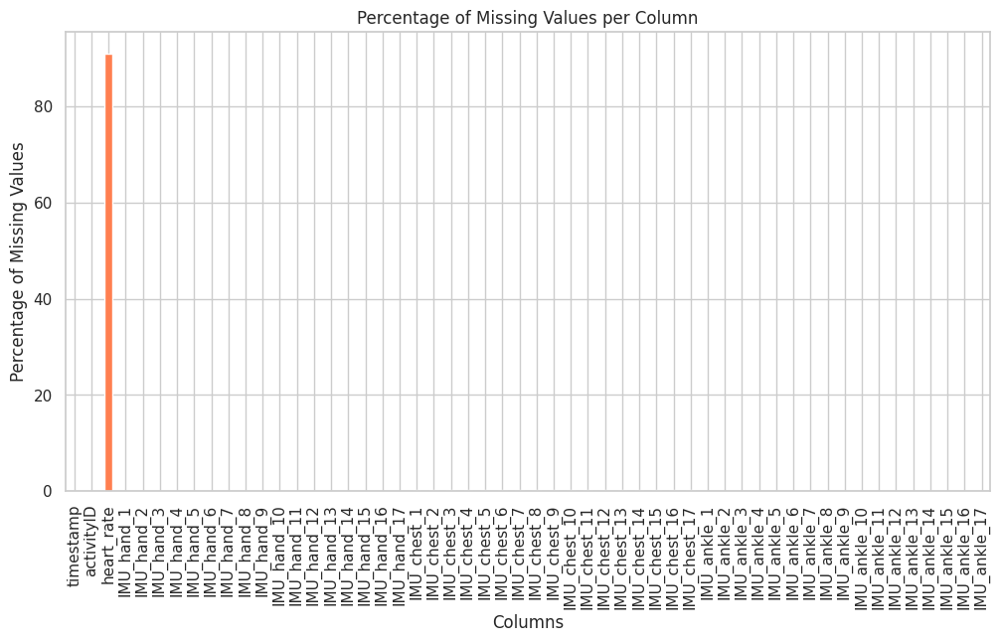

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# 1. Missing Values Plot
missing_data_percentage.plot(kind='bar', figsize=(12, 6), color="coral")
plt.title("Percentage of Missing Values per Column")
plt.xlabel("Columns")
plt.ylabel("Percentage of Missing Values")
plt.show()


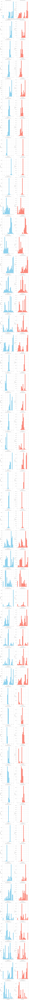

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

num_features = len(data_cleaned.columns[2:])
fig, axs = plt.subplots(num_features, 2, figsize=(12, 8 * num_features))  # Create a grid of subplots
fig.suptitle("Feature Distributions Before and After Scaling", fontsize=16)

# Loop through features and plot histograms side-by-side
for i, column in enumerate(data_cleaned.columns[2:]):
    # Before scaling
    axs[i, 0].hist(data_cleaned[column], bins=20, color='skyblue')
    axs[i, 0].set_title(f"Before Scaling: {column}")
    axs[i, 0].set_xlabel(column)
    axs[i, 0].set_ylabel("Frequency")

    # After scaling
    axs[i, 1].hist(scaled_data[column], bins=20, color='salmon')
    axs[i, 1].set_title(f"After Scaling: {column}")
    axs[i, 1].set_xlabel(column)
    axs[i, 1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [ ]:
# 5. Rolling Statistics Plot for Sample Feature
# Choose a single feature to illustrate rolling statistics
data = pd.read_csv('/content/combined_with_imputed_mean.csv')
sample_column = "heart_rate"

# Check if 'heart_rate' column exists in scaled_data
if sample_column in scaled_data.columns:
    rolling_mean = scaled_data[sample_column].rolling(window=100).mean()
    rolling_std = scaled_data[sample_column].rolling(window=100).std()

    plt.figure(figsize=(12, 6))
    plt.plot(scaled_data[sample_column][:2000], label="Original Data", color="blue", alpha=0.6)
    plt.plot(rolling_mean[:2000], label="Rolling Mean", color="orange")
    plt.plot(rolling_std[:2000], label="Rolling Std Dev", color="green")
    plt.title(f"Rolling Mean and Standard Deviation of {sample_column}")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend()
    plt.show()
else:
    print(f"Column '{sample_column}' not found in scaled_data DataFrame. Available columns are: {scaled_data.columns}")

Column 'heart_rate' not found in scaled_data DataFrame. Available columns are: Index(['IMU_hand_1', 'IMU_hand_2', 'IMU_hand_3', 'IMU_hand_4', 'IMU_hand_5',
       'IMU_hand_6', 'IMU_hand_7', 'IMU_hand_8', 'IMU_hand_9', 'IMU_hand_10',
       'IMU_hand_11', 'IMU_hand_12', 'IMU_hand_13', 'IMU_hand_14',
       'IMU_hand_15', 'IMU_hand_16', 'IMU_hand_17', 'IMU_chest_1',
       'IMU_chest_2', 'IMU_chest_3', 'IMU_chest_4', 'IMU_chest_5',
       'IMU_chest_6', 'IMU_chest_7', 'IMU_chest_8', 'IMU_chest_9',
       'IMU_chest_10', 'IMU_chest_11', 'IMU_chest_12', 'IMU_chest_13',
       'IMU_chest_14', 'IMU_chest_15', 'IMU_chest_16', 'IMU_chest_17',
       'IMU_ankle_1', 'IMU_ankle_2', 'IMU_ankle_3', 'IMU_ankle_4',
       'IMU_ankle_5', 'IMU_ankle_6', 'IMU_ankle_7', 'IMU_ankle_8',
       'IMU_ankle_9', 'IMU_ankle_10', 'IMU_ankle_11', 'IMU_ankle_12',
       'IMU_ankle_13', 'IMU_ankle_14', 'IMU_ankle_15', 'IMU_ankle_16',
       'IMU_ankle_17'],
      dtype='object')


# **Train the model**
1. Random Forest


Split the data

In [ ]:
from sklearn.model_selection import train_test_split

# Define features (X) and target variable (y)
X = data.drop('activityID', axis=1)  # Features
y = data['activityID']  # Labels

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
print(data.isna().sum())

timestamp       0
activityID      0
heart_rate      0
IMU_hand_1      0
IMU_hand_2      0
IMU_hand_3      0
IMU_hand_4      0
IMU_hand_5      0
IMU_hand_6      0
IMU_hand_7      0
IMU_hand_8      0
IMU_hand_9      0
IMU_hand_10     0
IMU_hand_11     0
IMU_hand_12     0
IMU_hand_13     0
IMU_hand_14     0
IMU_hand_15     0
IMU_hand_16     0
IMU_hand_17     0
IMU_chest_1     0
IMU_chest_2     1
IMU_chest_3     1
IMU_chest_4     1
IMU_chest_5     1
IMU_chest_6     1
IMU_chest_7     1
IMU_chest_8     1
IMU_chest_9     1
IMU_chest_10    1
IMU_chest_11    1
IMU_chest_12    1
IMU_chest_13    1
IMU_chest_14    1
IMU_chest_15    1
IMU_chest_16    1
IMU_chest_17    1
IMU_ankle_1     1
IMU_ankle_2     1
IMU_ankle_3     1
IMU_ankle_4     1
IMU_ankle_5     1
IMU_ankle_6     1
IMU_ankle_7     1
IMU_ankle_8     1
IMU_ankle_9     1
IMU_ankle_10    1
IMU_ankle_11    1
IMU_ankle_12    1
IMU_ankle_13    1
IMU_ankle_14    1
IMU_ankle_15    1
IMU_ankle_16    1
IMU_ankle_17    1
dtype: int64


No missing values left in csv file hence not used for now


In [ ]:
print(data.columns)
data.dropna(subset=['rolling_mean'], inplace=True)

Index(['timestamp', 'activityID', 'heart_rate', 'IMU_hand_1', 'IMU_hand_2',
       'IMU_hand_3', 'IMU_hand_4', 'IMU_hand_5', 'IMU_hand_6', 'IMU_hand_7',
       'IMU_hand_8', 'IMU_hand_9', 'IMU_hand_10', 'IMU_hand_11', 'IMU_hand_12',
       'IMU_hand_13', 'IMU_hand_14', 'IMU_hand_15', 'IMU_hand_16',
       'IMU_hand_17', 'IMU_chest_1', 'IMU_chest_2', 'IMU_chest_3',
       'IMU_chest_4', 'IMU_chest_5', 'IMU_chest_6', 'IMU_chest_7',
       'IMU_chest_8', 'IMU_chest_9', 'IMU_chest_10', 'IMU_chest_11',
       'IMU_chest_12', 'IMU_chest_13', 'IMU_chest_14', 'IMU_chest_15',
       'IMU_chest_16', 'IMU_chest_17', 'IMU_ankle_1', 'IMU_ankle_2',
       'IMU_ankle_3', 'IMU_ankle_4', 'IMU_ankle_5', 'IMU_ankle_6',
       'IMU_ankle_7', 'IMU_ankle_8', 'IMU_ankle_9', 'IMU_ankle_10',
       'IMU_ankle_11', 'IMU_ankle_12', 'IMU_ankle_13', 'IMU_ankle_14',
       'IMU_ankle_15', 'IMU_ankle_16', 'IMU_ankle_17'],
      dtype='object')


KeyError: ['rolling_mean']

In [ ]:
# Ensure that you've handled the rolling_mean NaNs before model training
# Drop rows with missing values in the 'rolling_mean' column

# Now, you can proceed with splitting your data into features (X) and labels (y)

# Define features (X) and target variable (y)
# Assuming 'activityID' is the target and other columns are features
X = data.drop(columns=['activityID', 'timestamp'])  # Drop target and irrelevant columns like 'timestamp'
y = data['activityID']


In [ ]:

# Split the data into training and test sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features using StandardScaler
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [ ]:

# Check for NaNs in the entire dataset and handle them (e.g., impute)
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')  # Replace NaNs with the mean of each column
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

# Import and train a Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Initialize the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# ***Linear Regression***

# **Training - 2**


In [ ]:
#Here’s the code to train and evaluate models for missing value prediction on
#each column:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
import pickle

# Initialize a dictionary to store models for each column
trained_models = {}

# Loop over each column to treat as the target (Y) and all other columns as features (X)
for target_col in scaled_data.columns[2:]:  # Exclude 'timestamp' and 'activityID'

    # Define X and y
    X = scaled_data.drop(columns=[target_col])  # All other columns as features
    y = scaled_data[target_col]  # Current column as target

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Select model based on the type of column
    # Linear Regression for continuous features
    model = LinearRegression()

    # Train the model
    model.fit(X_train, y_train)

    # Cross-validation scores
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    print(f"{target_col} - Mean CV RMSE: {(-cv_scores.mean()) ** 0.5:.4f}")

    # Save the trained model
    trained_models[target_col] = model
    # Save the model to a file (optional)
    with open(f"model_{target_col}.pkl", "wb") as f:
        pickle.dump(model, f)


IMU_hand_3 - Mean CV RMSE: 0.0862
IMU_hand_4 - Mean CV RMSE: 0.0802
IMU_hand_5 - Mean CV RMSE: 0.0296
IMU_hand_6 - Mean CV RMSE: 0.0864
IMU_hand_7 - Mean CV RMSE: 0.0791
IMU_hand_8 - Mean CV RMSE: 0.8641
IMU_hand_9 - Mean CV RMSE: 0.8732
IMU_hand_10 - Mean CV RMSE: 0.9065
IMU_hand_11 - Mean CV RMSE: 0.2407
IMU_hand_12 - Mean CV RMSE: 0.3465
IMU_hand_13 - Mean CV RMSE: 0.2832
IMU_hand_14 - Mean CV RMSE: 0.3667
IMU_hand_15 - Mean CV RMSE: 0.4750
IMU_hand_16 - Mean CV RMSE: 0.2669
IMU_hand_17 - Mean CV RMSE: 0.3615
IMU_chest_1 - Mean CV RMSE: 0.1026
IMU_chest_2 - Mean CV RMSE: 0.1602
IMU_chest_3 - Mean CV RMSE: 0.0415
IMU_chest_4 - Mean CV RMSE: 0.0369
IMU_chest_5 - Mean CV RMSE: 0.1590
IMU_chest_6 - Mean CV RMSE: 0.0415
IMU_chest_7 - Mean CV RMSE: 0.0366
IMU_chest_8 - Mean CV RMSE: 0.8569
IMU_chest_9 - Mean CV RMSE: 0.8121
IMU_chest_10 - Mean CV RMSE: 0.8568
IMU_chest_11 - Mean CV RMSE: 0.1566
IMU_chest_12 - Mean CV RMSE: 0.1702
IMU_chest_13 - Mean CV RMSE: 0.1553
IMU_chest_14 - Mean CV 

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
import pickle

# List of columns to train individually
columns_to_train = ['IMU_hand_1', 'IMU_hand_2']  # Add other columns as needed

# Loop through each column
for target_col in columns_to_train:
    print(f"Training model for column: {target_col}")

    # Define X and y
    X = scaled_data.drop(columns=[target_col])  # All other columns as features
    y = scaled_data[target_col]  # Current column as target

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize the model
    model = LinearRegression()

    # Train the model
    model.fit(X_train, y_train)

    # Cross-validation scores
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse = (-cv_scores.mean()) ** 0.5
    print(f"{target_col} - Mean CV RMSE: {rmse:.4f}")

    # Save the trained model to a .pkl file
    model_filename = f"model_{target_col}.pkl"
    with open(model_filename, "wb") as f:
        pickle.dump(model, f)
    print(f"Model saved to {model_filename}\n")


Training model for column: IMU_hand_1
IMU_hand_1 - Mean CV RMSE: 0.0608
Model saved to model_IMU_hand_1.pkl

Training model for column: IMU_hand_2
IMU_hand_2 - Mean CV RMSE: 0.0296
Model saved to model_IMU_hand_2.pkl



# **Testing the Model**

An error occurred with heart_rate: "['timestamp', 'activityID'] not in index"
An error occurred with IMU_hand_1: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
An error occurred with IMU_hand_2: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor whic

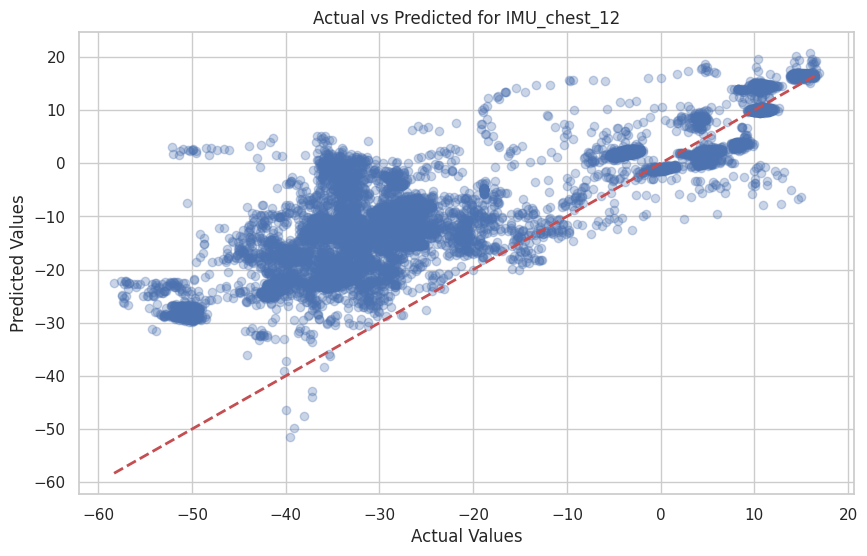

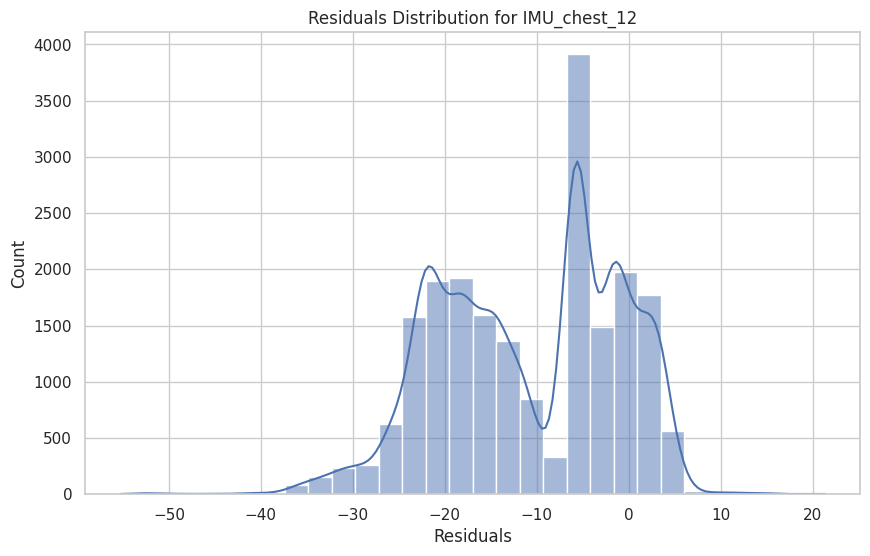

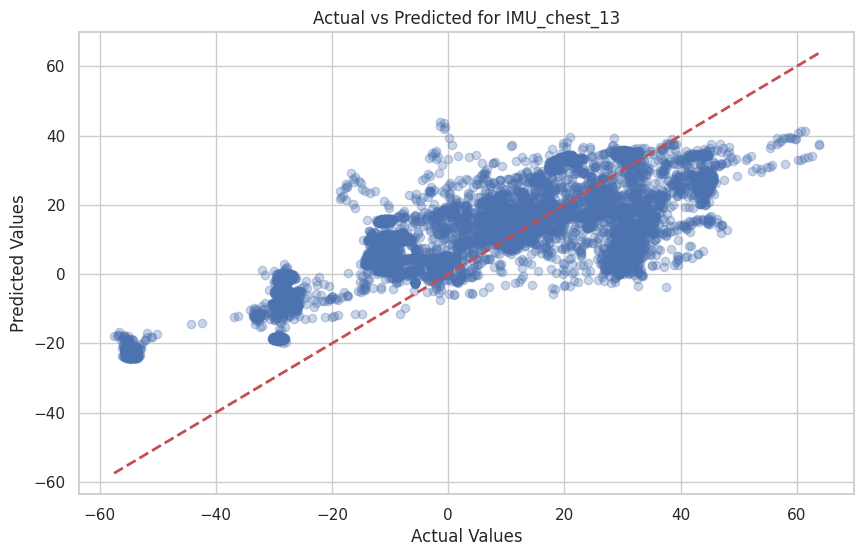

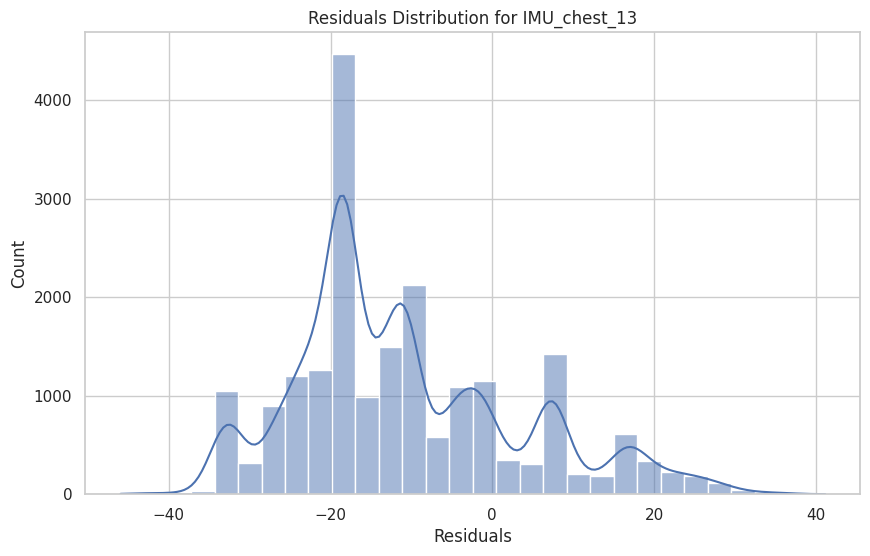

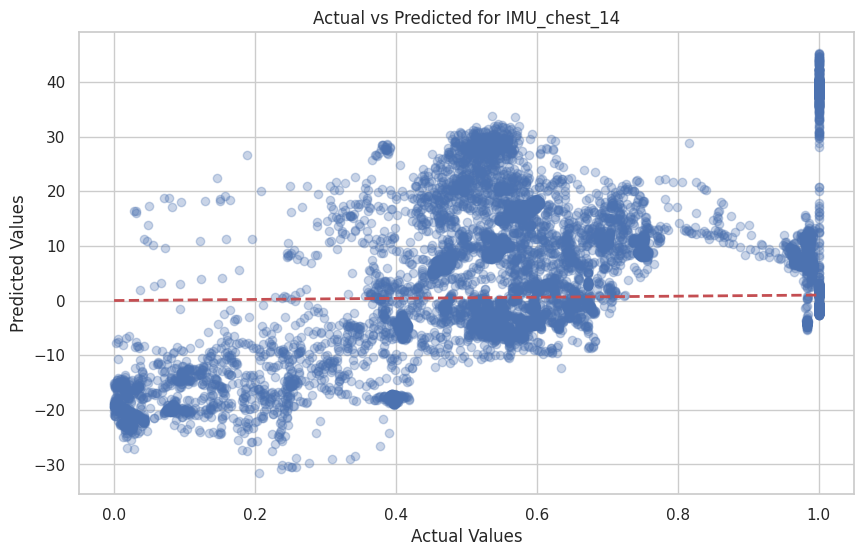

...

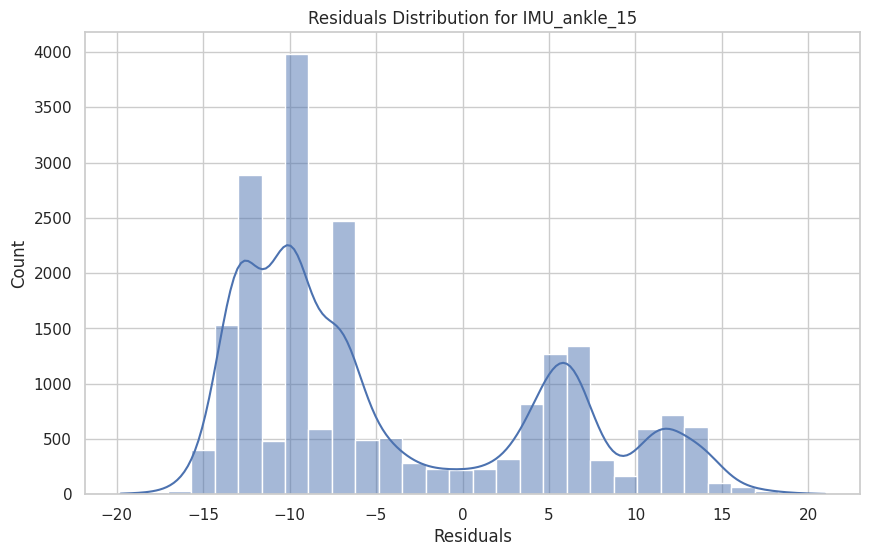

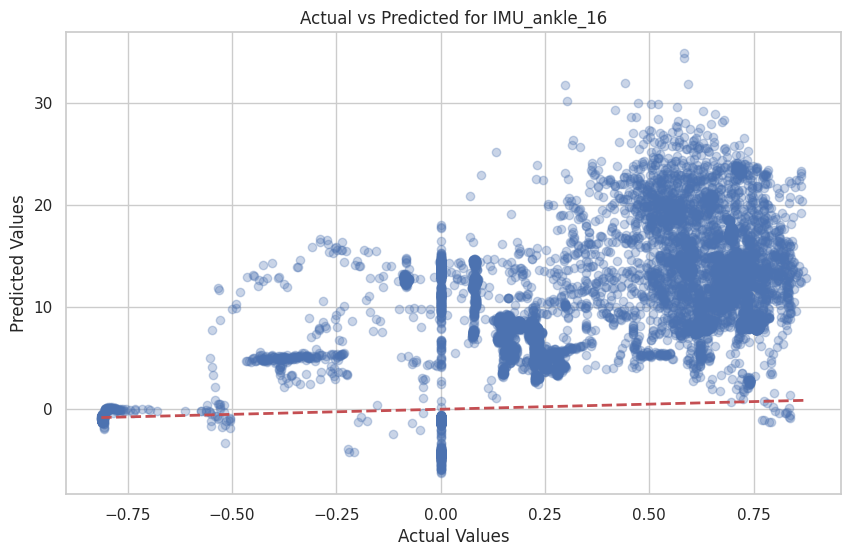

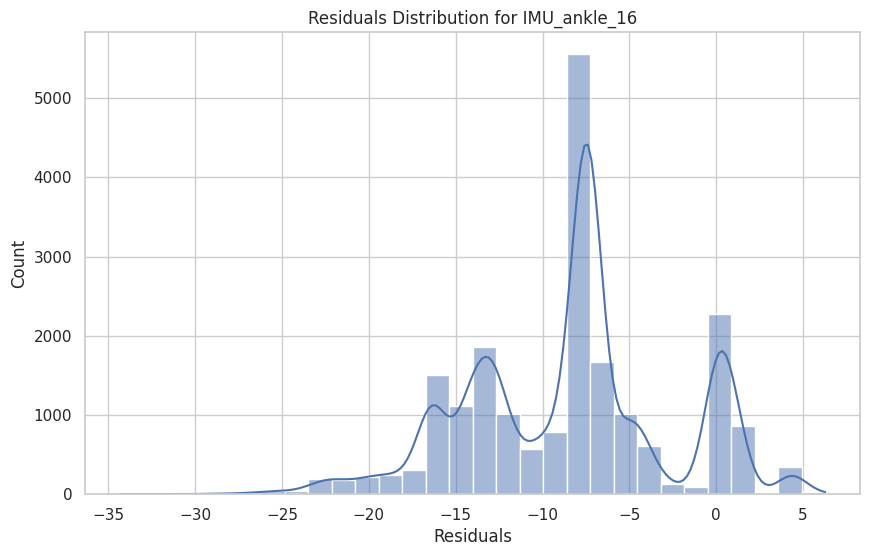

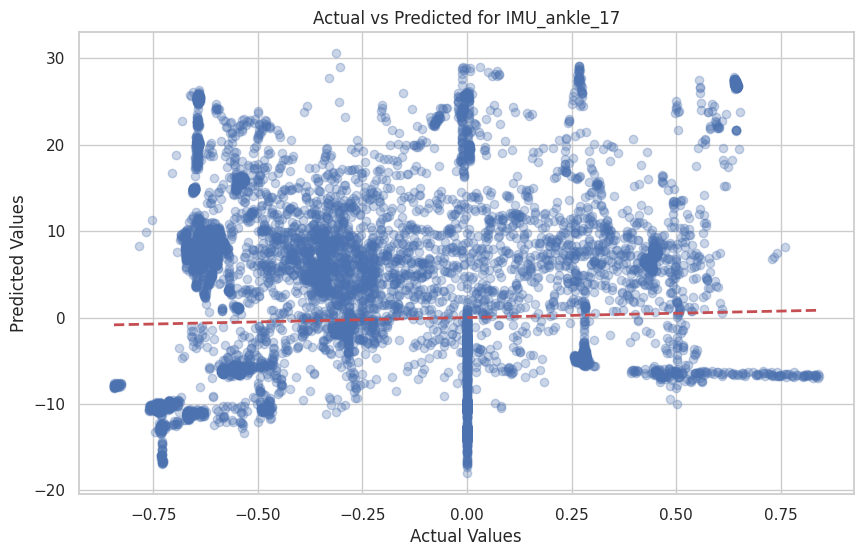

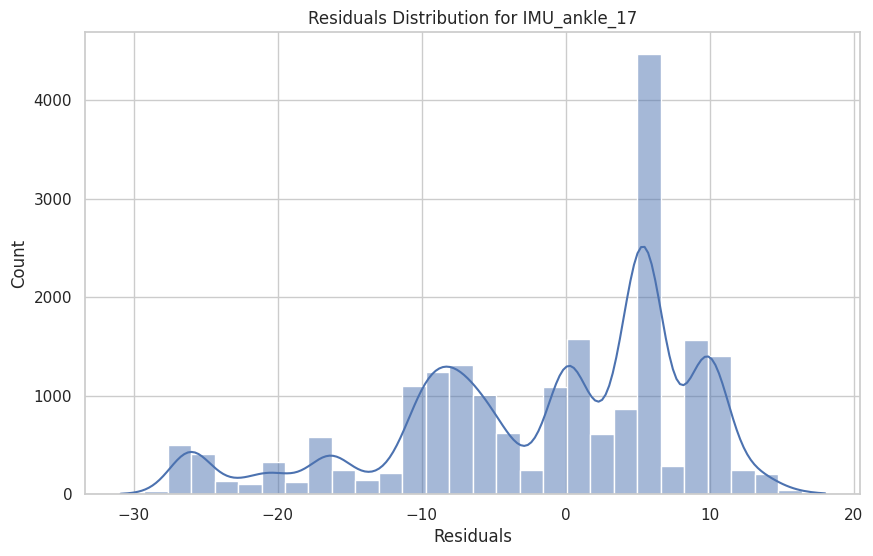

Metrics for IMU_chest_12:
 - MSE: 214.8927
 - RMSE: 14.6592
 - MAE: 11.6610
 - R^2 Score: 0.4908

----------------------------------------

Metrics for IMU_chest_13:
 - MSE: 314.9932
 - RMSE: 17.7480
 - MAE: 15.6031
 - R^2 Score: 0.5455

----------------------------------------

Metrics for IMU_chest_14:
 - MSE: 179.7132
 - RMSE: 13.4057
 - MAE: 10.5501
 - R^2 Score: -1955.8108

----------------------------------------

Metrics for IMU_chest_15:
 - MSE: 194.2060
 - RMSE: 13.9358
 - MAE: 11.1205
 - R^2 Score: -2988.9385

----------------------------------------

Metrics for IMU_chest_16:
 - MSE: 41.7939
 - RMSE: 6.4648
 - MAE: 5.0990
 - R^2 Score: -326.7367

----------------------------------------

Metrics for IMU_chest_17:
 - MSE: 38.9225
 - RMSE: 6.2388
 - MAE: 4.9052
 - R^2 Score: -321.8344

----------------------------------------

Metrics for IMU_ankle_1:
 - MSE: 20.0783
 - RMSE: 4.4809
 - MAE: 3.8641
 - R^2 Score: -6.3958

----------------------------------------

Metrics for IMU

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pickle
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset and split into training and test sets as before
scaled_data = pd.read_csv('/content/combined_with_imputed_mean.csv')
scaled_data = scaled_data.dropna(subset=['timestamp', 'activityID'])
_, test_data = train_test_split(scaled_data, test_size=0.2, random_state=42)

# Drop any columns like 'timestamp' and 'activityID' from the test data
X_test_full = test_data.drop(columns=['timestamp', 'activityID'])
y_test_full = test_data.drop(columns=['timestamp', 'activityID'])

# Dictionary to store evaluation results for each column
results = {}

for target_col in X_test_full.columns:
    try:
        # Load the model for this specific target column
        with open(f"model_{target_col}.pkl", "rb") as f:
            model = pickle.load(f)

        # Ensure features in test data match those in training
        trained_features = model.feature_names_in_  # Get features used during training
        X_test = X_test_full[X_test_full[target_col].notna()][trained_features]  # Ensure columns match
        y_test = y_test_full[target_col].dropna()

        # Predict and calculate evaluation metrics
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = mse ** 0.5
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        # Store metrics in results dictionary
        results[target_col] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae, 'R^2': r2}

        # Visualization
        plt.figure(figsize=(10, 6))
        plt.scatter(y_test, y_pred, alpha=0.3)
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.title(f'Actual vs Predicted for {target_col}')
        plt.show()

        # Residuals distribution
        residuals = y_test - y_pred
        plt.figure(figsize=(10, 6))
        sns.histplot(residuals, kde=True, bins=30)
        plt.xlabel('Residuals')
        plt.title(f'Residuals Distribution for {target_col}')
        plt.show()

    except FileNotFoundError:
        print(f"Model for {target_col} not found. Skipping.")
    except Exception as e:
        print(f"An error occurred with {target_col}: {e}")

# Summary of results
for column, metrics in results.items():
    print(f"Metrics for {column}:")
    print(f" - MSE: {metrics['MSE']:.4f}")
    print(f" - RMSE: {metrics['RMSE']:.4f}")
    print(f" - MAE: {metrics['MAE']:.4f}")
    print(f" - R^2 Score: {metrics['R^2']:.4f}")
    print("\n" + "-"*40 + "\n")


# **Predict missing values using models**

In [ ]:
import pandas as pd
import numpy as np

# Load the trained models
trained_models = {}
for target_col in columns_to_train:
    model_filename = f"model_{target_col}.pkl"
    with open(model_filename, "rb") as f:
        trained_models[target_col] = pickle.load(f)

# Function to predict missing values in each column
def predict_missing_values(data, trained_models):
    for target_col in trained_models:
        # Identify rows with missing values in the target column
        missing_mask = data[target_col].isna()

        if missing_mask.any():
            print(f"Predicting missing values for {target_col}...")

            # Define X (features) for prediction (excluding the target column)
            X_missing = data[missing_mask].drop(columns=[target_col])

            # Use the model to predict missing values
            model = trained_models[target_col]
            predicted_values = model.predict(X_missing)

            # Fill the missing values with the predicted ones
            data.loc[missing_mask, target_col] = predicted_values

    return data

# Apply the prediction function
data_with_filled_missing_values = predict_missing_values(scaled_data, trained_models)


# ***Random Forest Algorithm***

# **Training**

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import pickle
import os

# Assuming Google Drive is mounted if you want to save models there
save_path = "/content/models"  # Or "/content/drive/MyDrive/models" if using Google Drive
os.makedirs(save_path, exist_ok=True)

for target_col in scaled_data.columns[2:]:  # Exclude 'timestamp' and 'activityID'
    # Define X and y
    X = scaled_data.drop(columns=[target_col])
    y = scaled_data[target_col]

    # Filter out rows where y (target) is NaN
    non_nan_indices = ~y.isna()
    X = X[non_nan_indices]
    y = y[non_nan_indices]

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize model and train
    model = RandomForestRegressor(n_estimators=5, random_state=42)
    model.fit(X_train, y_train)

    # Save model
    model_filename = os.path.join(save_path, f"RF_model_{target_col}.pkl")
    with open(model_filename, "wb") as f:
        pickle.dump(model, f)
    print(f"Saved model for {target_col}")


Saved model for heart_rate
Saved model for IMU_hand_1
Saved model for IMU_hand_2
Saved model for IMU_hand_3
Saved model for IMU_hand_4
Saved model for IMU_hand_5
Saved model for IMU_hand_6
Saved model for IMU_hand_7
Saved model for IMU_hand_8
Saved model for IMU_hand_9
Saved model for IMU_hand_10
Saved model for IMU_hand_11
Saved model for IMU_hand_12
Saved model for IMU_hand_13
Saved model for IMU_hand_14
Saved model for IMU_hand_15
Saved model for IMU_hand_16
Saved model for IMU_hand_17
Saved model for IMU_chest_1
Saved model for IMU_chest_2
Saved model for IMU_chest_3
Saved model for IMU_chest_4
Saved model for IMU_chest_5
Saved model for IMU_chest_6
Saved model for IMU_chest_7
Saved model for IMU_chest_8
Saved model for IMU_chest_9
Saved model for IMU_chest_10
Saved model for IMU_chest_11
Saved model for IMU_chest_12
Saved model for IMU_chest_13
Saved model for IMU_chest_14
Saved model for IMU_chest_15
Saved model for IMU_chest_16
Saved model for IMU_chest_17
Saved model for IMU_an

In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pickle

# Load the dataset
scaled_data = pd.read_csv('/content/combined_with_imputed_mean.csv')

# Remove 'timestamp' and 'activityID' columns
scaled_data_cleaned = scaled_data.drop(columns=['timestamp', 'activityID'])

# Create the models directory if it doesn't exist
models_dir = '/content/models2'
os.makedirs(models_dir, exist_ok=True)

# Initialize a dictionary to store trained models
trained_models = {}

# Loop over each column to treat as the target and all other columns as features
for target_col in scaled_data_cleaned.columns:
    # Define X (features) and y (target)
    X = scaled_data_cleaned.drop(columns=[target_col])  # Exclude the target column from features
    y = scaled_data_cleaned[target_col]

    # Drop rows where the target column (y) has NaN values
    X = X[~y.isna()]
    y = y.dropna()

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Instantiate the RandomForestRegressor
    model = RandomForestRegressor(n_estimators=5, random_state=42)

    # Train the model
    model.fit(X_train, y_train)

    # Save the model in /content/models2
    model_filename = f'{models_dir}/RF_model_{target_col}.pkl'
    with open(model_filename, 'wb') as f:
        pickle.dump(model, f)

    # Store the trained model in the dictionary
    trained_models[target_col] = model

    print(f"Model for {target_col} trained and saved.")


Model for heart_rate trained and saved.
Model for IMU_hand_1 trained and saved.
Model for IMU_hand_2 trained and saved.
Model for IMU_hand_3 trained and saved.
Model for IMU_hand_4 trained and saved.
Model for IMU_hand_5 trained and saved.
Model for IMU_hand_6 trained and saved.
Model for IMU_hand_7 trained and saved.
Model for IMU_hand_8 trained and saved.
Model for IMU_hand_9 trained and saved.
Model for IMU_hand_10 trained and saved.
Model for IMU_hand_11 trained and saved.
Model for IMU_hand_12 trained and saved.
Model for IMU_hand_13 trained and saved.
Model for IMU_hand_14 trained and saved.
Model for IMU_hand_15 trained and saved.
Model for IMU_hand_16 trained and saved.
Model for IMU_hand_17 trained and saved.
Model for IMU_chest_1 trained and saved.
Model for IMU_chest_2 trained and saved.
Model for IMU_chest_3 trained and saved.
Model for IMU_chest_4 trained and saved.
Model for IMU_chest_5 trained and saved.
Model for IMU_chest_6 trained and saved.
Model for IMU_chest_7 trai

# **Testing**

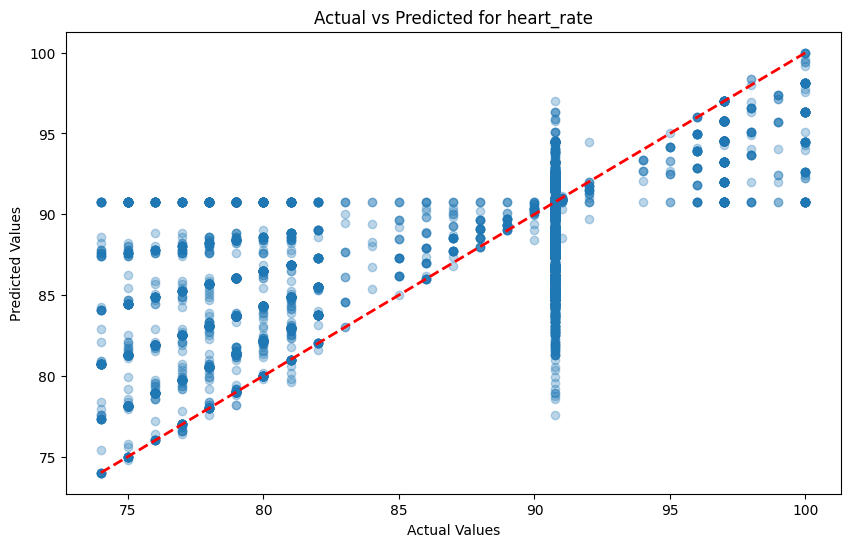

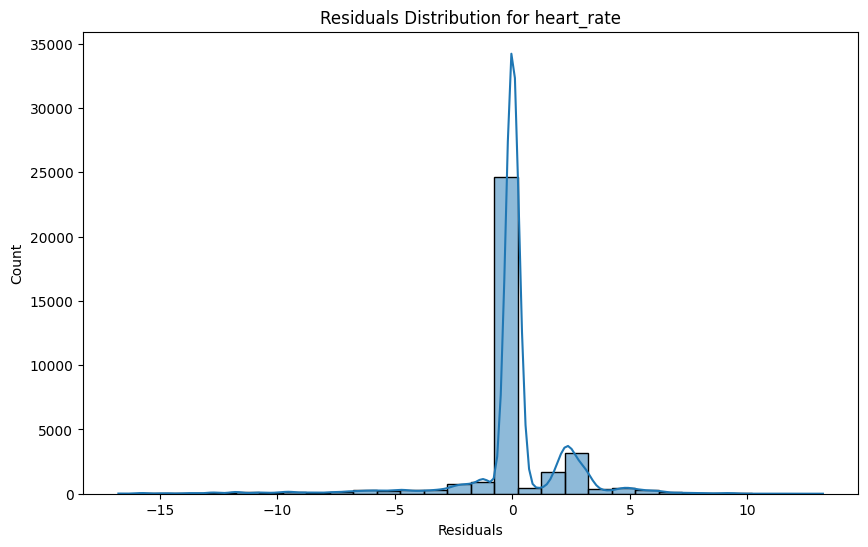

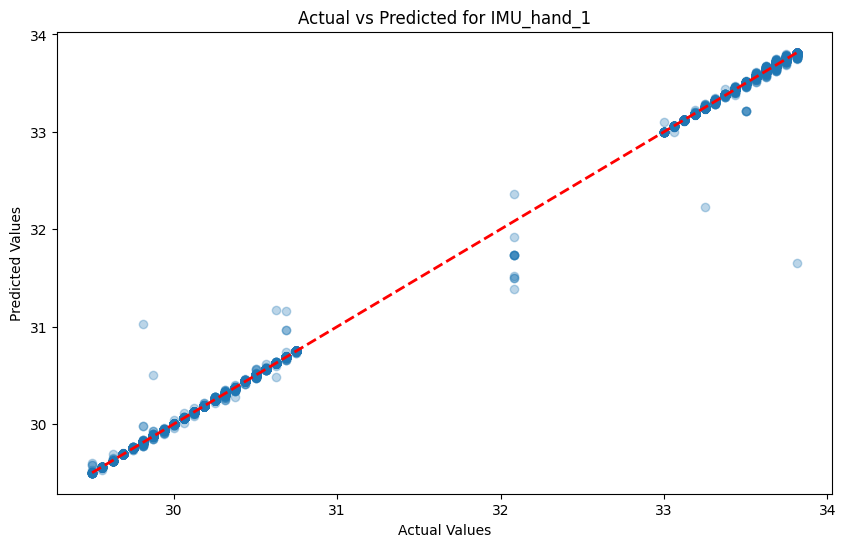

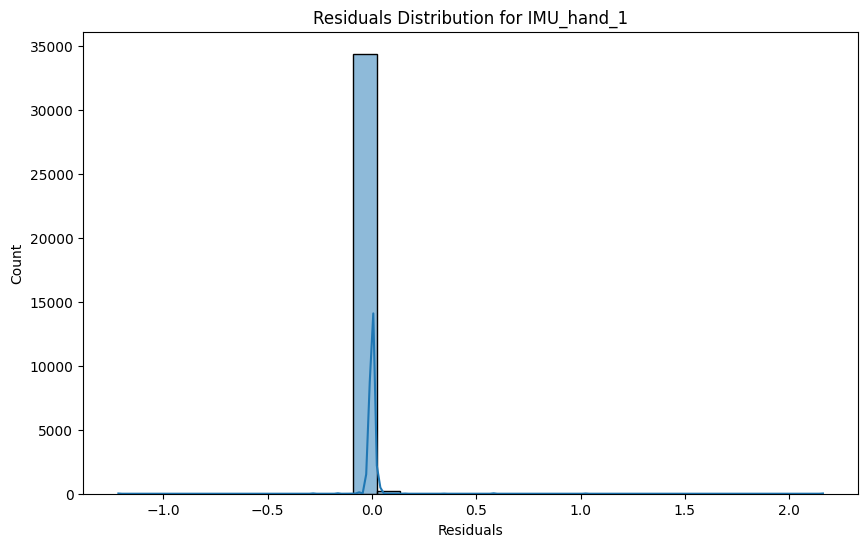

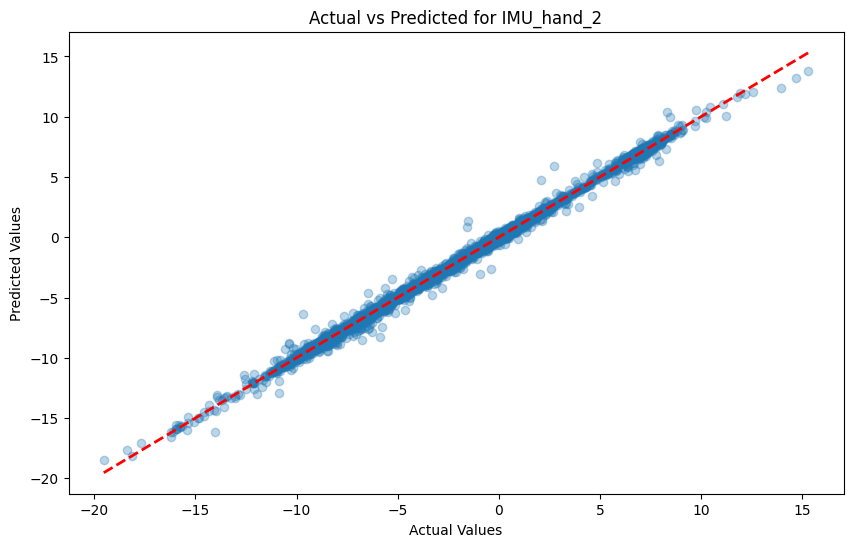

...

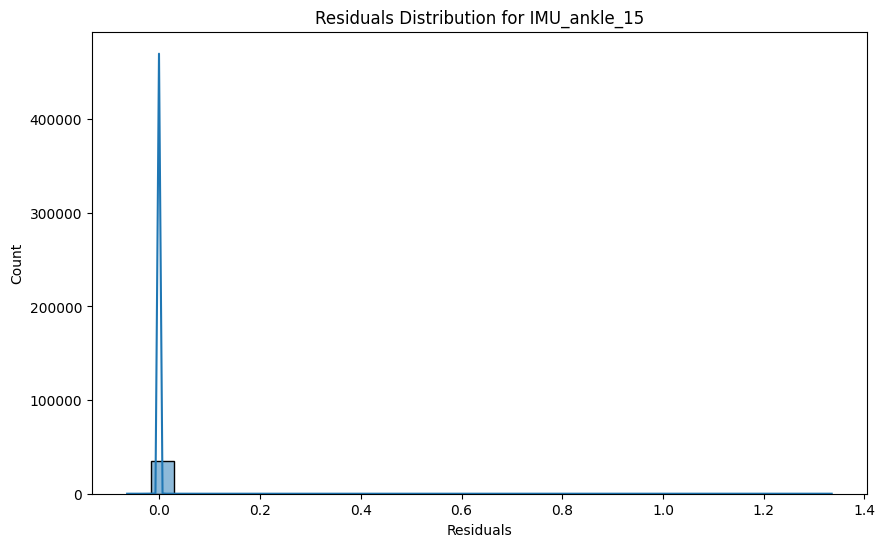

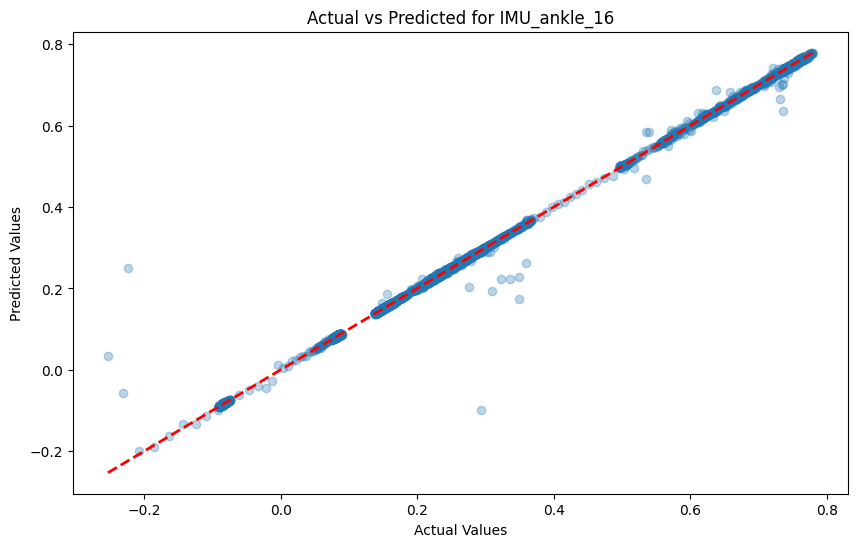

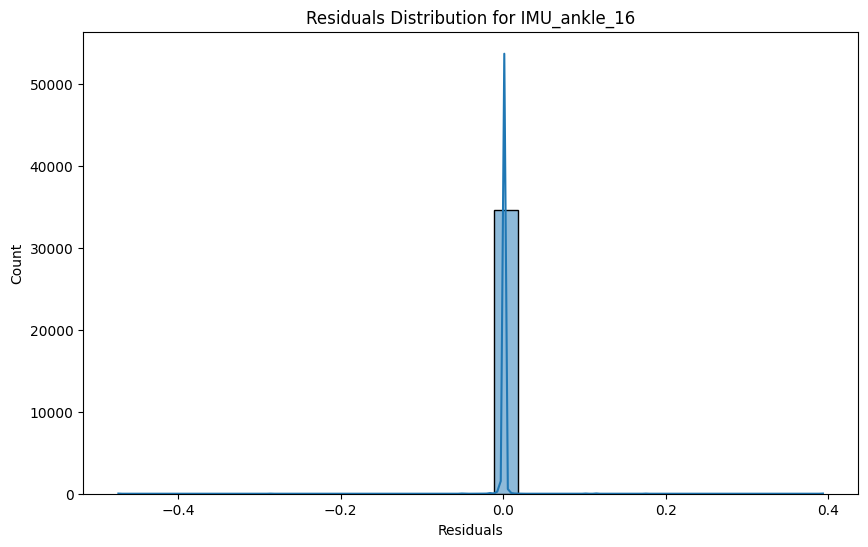

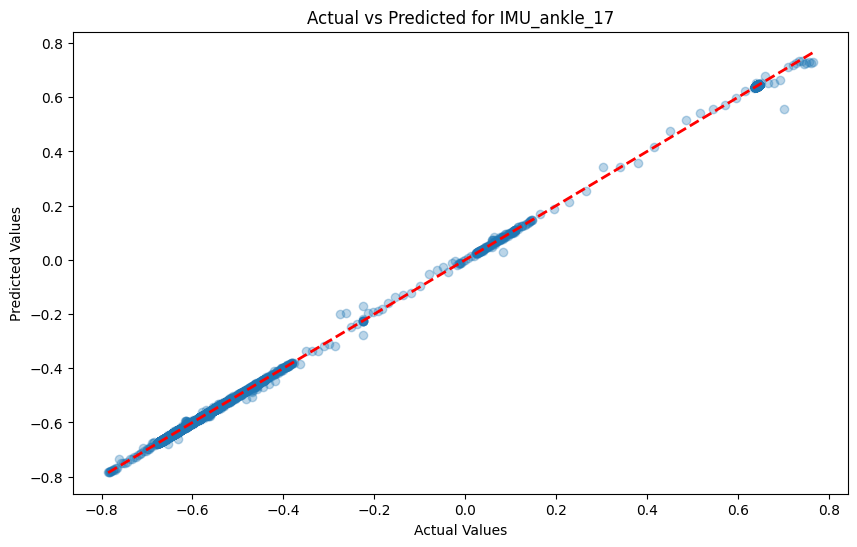

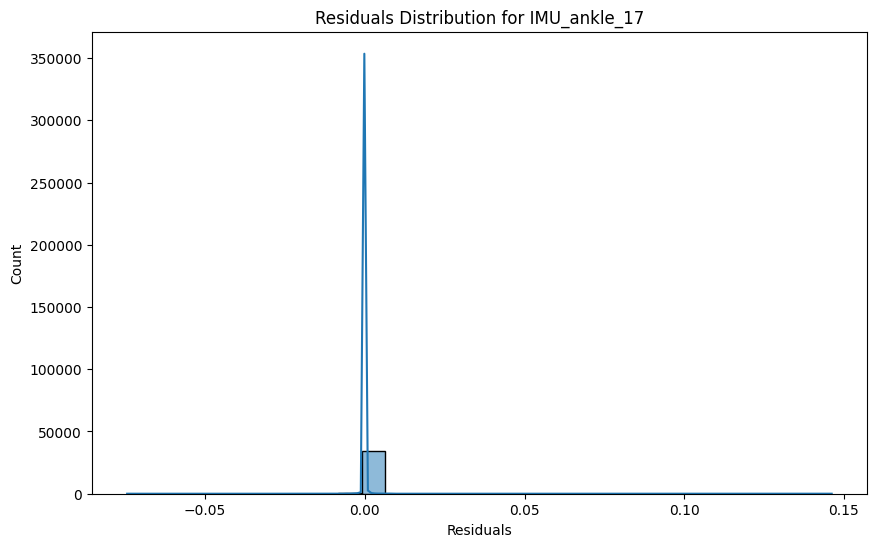

Metrics for heart_rate:
 - MSE: 5.2628
 - RMSE: 2.2941
 - MAE: 0.9869
 - R^2 Score: 0.5261

----------------------------------------

Metrics for IMU_hand_1:
 - MSE: 0.0003
 - RMSE: 0.0182
 - MAE: 0.0012
 - R^2 Score: 0.9999

----------------------------------------

Metrics for IMU_hand_2:
 - MSE: 0.0117
 - RMSE: 0.1080
 - MAE: 0.0502
 - R^2 Score: 0.9997

----------------------------------------

Metrics for IMU_hand_3:
 - MSE: 0.0341
 - RMSE: 0.1846
 - MAE: 0.0741
 - R^2 Score: 0.9929

----------------------------------------

Metrics for IMU_hand_4:
 - MSE: 0.0179
 - RMSE: 0.1337
 - MAE: 0.0656
 - R^2 Score: 0.9978

----------------------------------------

Metrics for IMU_hand_5:
 - MSE: 0.0096
 - RMSE: 0.0978
 - MAE: 0.0383
 - R^2 Score: 0.9998

----------------------------------------

Metrics for IMU_hand_6:
 - MSE: 0.0320
 - RMSE: 0.1788
 - MAE: 0.0673
 - R^2 Score: 0.9934

----------------------------------------

Metrics for IMU_hand_7:
 - MSE: 0.0138
 - RMSE: 0.1175
 - MAE:

In [ ]:
import os
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pickle
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset (the one to be used for testing, excluding 'timestamp' and 'activityID')
scaled_data = pd.read_csv('/content/combined_with_imputed_mean.csv')
scaled_data_cleaned = scaled_data.drop(columns=['timestamp', 'activityID'])

# Split the dataset into features (X) and target (y)
X_full = scaled_data_cleaned
results = {}

# Load each trained Random Forest model and evaluate
for target_col in X_full.columns:
    try:
        # Load the model for this target column
        model_filename = f'/content/models2/RF_model_{target_col}.pkl'
        with open(model_filename, 'rb') as f:
            model = pickle.load(f)

        # Check if there are any NaN values in the target column during testing
        X_test = X_full[X_full[target_col].notna()]  # Only keep rows where the target is not NaN
        y_test = X_test[target_col]  # Actual values of the target column
        X_test = X_test.drop(columns=[target_col])  # Drop target column from the features

        # Predict and calculate metrics
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        # Store results
        results[target_col] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae, 'R^2': r2}

        # Visualization: Actual vs Predicted
        plt.figure(figsize=(10, 6))
        plt.scatter(y_test, y_pred, alpha=0.3)
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.title(f'Actual vs Predicted for {target_col}')
        plt.show()

        # Visualization: Residuals Distribution
        residuals = y_test - y_pred
        plt.figure(figsize=(10, 6))
        sns.histplot(residuals, kde=True, bins=30)
        plt.xlabel('Residuals')
        plt.title(f'Residuals Distribution for {target_col}')
        plt.show()

    except FileNotFoundError:
        print(f"Model for {target_col} not found. Skipping.")
    except Exception as e:
        print(f"An error occurred with {target_col}: {e}")

# Summary of results
for column, metrics in results.items():
    print(f"Metrics for {column}:")
    print(f" - MSE: {metrics['MSE']:.4f}")
    print(f" - RMSE: {metrics['RMSE']:.4f}")
    print(f" - MAE: {metrics['MAE']:.4f}")
    print(f" - R^2 Score: {metrics['R^2']:.4f}")
    print("\n" + "-"*40 + "\n")


# **Anomaly Detection**

In [ ]:
import numpy as np

# Set the anomaly threshold (e.g., residuals beyond 2 standard deviations are anomalies)
anomaly_threshold_factor = 10  # You can adjust this value

# Dictionary to store anomalies
anomalies = {}

for target_col in X_test_full.columns:
    try:
        # Load the model for this specific target column
        with open(f"/content/models2/RF_model_{target_col}.pkl", "rb") as f:
            model = pickle.load(f)

        # Ensure features in test data match those in training
        trained_features = model.feature_names_in_  # Get features used during training
        X_test = X_test_full[X_test_full[target_col].notna()][trained_features]
        y_test = y_test_full[target_col].dropna()

        # Predict
        y_pred = model.predict(X_test)
        residuals = y_test - y_pred

        # Calculate anomaly threshold based on residuals
        mean_residual = np.mean(residuals)
        std_residual = np.std(residuals)
        anomaly_threshold = mean_residual + anomaly_threshold_factor * std_residual

        # Identify anomalies where residual exceeds the threshold
        anomaly_indices = residuals[abs(residuals) > anomaly_threshold].index
        anomalies[target_col] = anomaly_indices

        print(f"Anomalies detected for {target_col}: {len(anomaly_indices)} instances")

    except FileNotFoundError:
        print(f"Model for {target_col} not found. Skipping.")
    except Exception as e:
        print(f"An error occurred with {target_col}: {e}")


Anomalies detected for heart_rate: 0 instances
Anomalies detected for IMU_hand_1: 6 instances
Anomalies detected for IMU_hand_2: 12 instances
Anomalies detected for IMU_hand_3: 12 instances
Anomalies detected for IMU_hand_4: 10 instances
Anomalies detected for IMU_hand_5: 16 instances
Anomalies detected for IMU_hand_6: 9 instances
Anomalies detected for IMU_hand_7: 7 instances
Anomalies detected for IMU_hand_8: 12 instances
Anomalies detected for IMU_hand_9: 12 instances
Anomalies detected for IMU_hand_10: 14 instances
Anomalies detected for IMU_hand_11: 8 instances
Anomalies detected for IMU_hand_12: 4 instances
Anomalies detected for IMU_hand_13: 9 instances
Anomalies detected for IMU_hand_14: 10 instances
Anomalies detected for IMU_hand_15: 13 instances
Anomalies detected for IMU_hand_16: 9 instances
Anomalies detected for IMU_hand_17: 17 instances
Anomalies detected for IMU_chest_1: 1 instances
Anomalies detected for IMU_chest_2: 7 instances
Anomalies detected for IMU_chest_3: 9 in

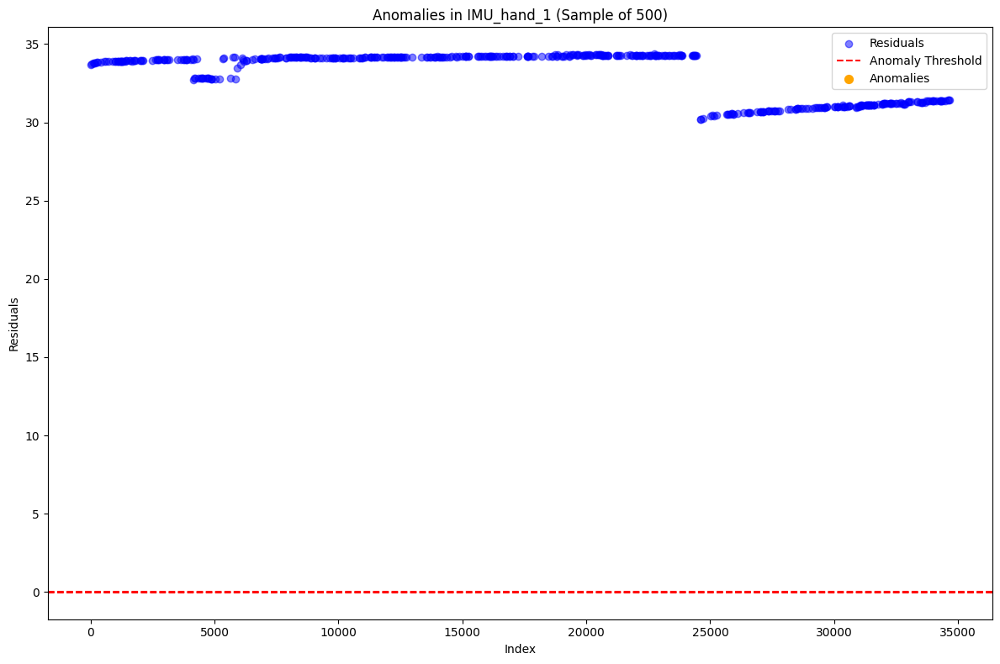

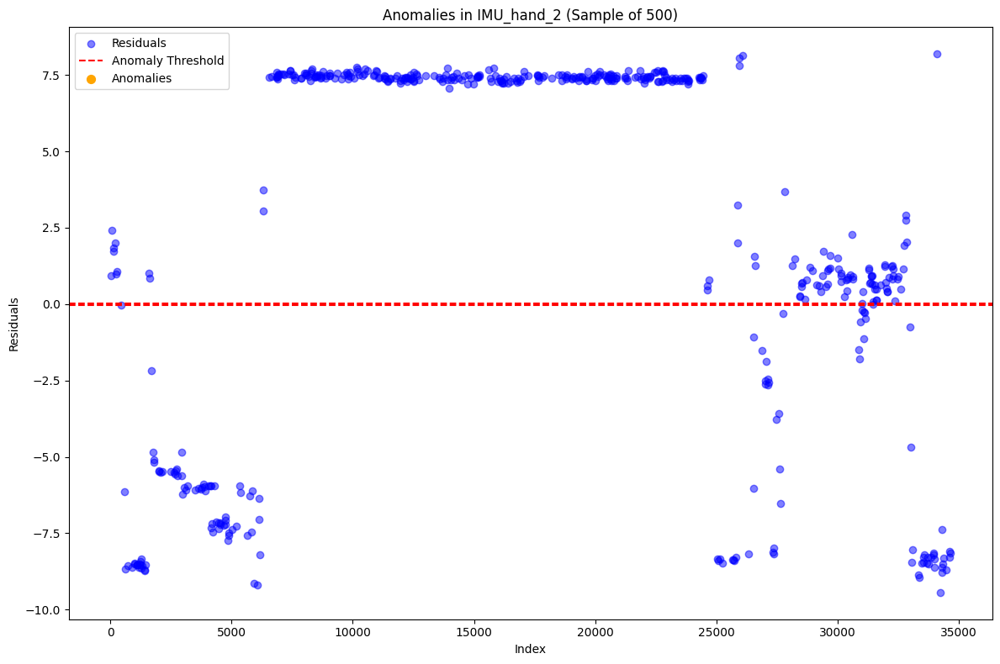

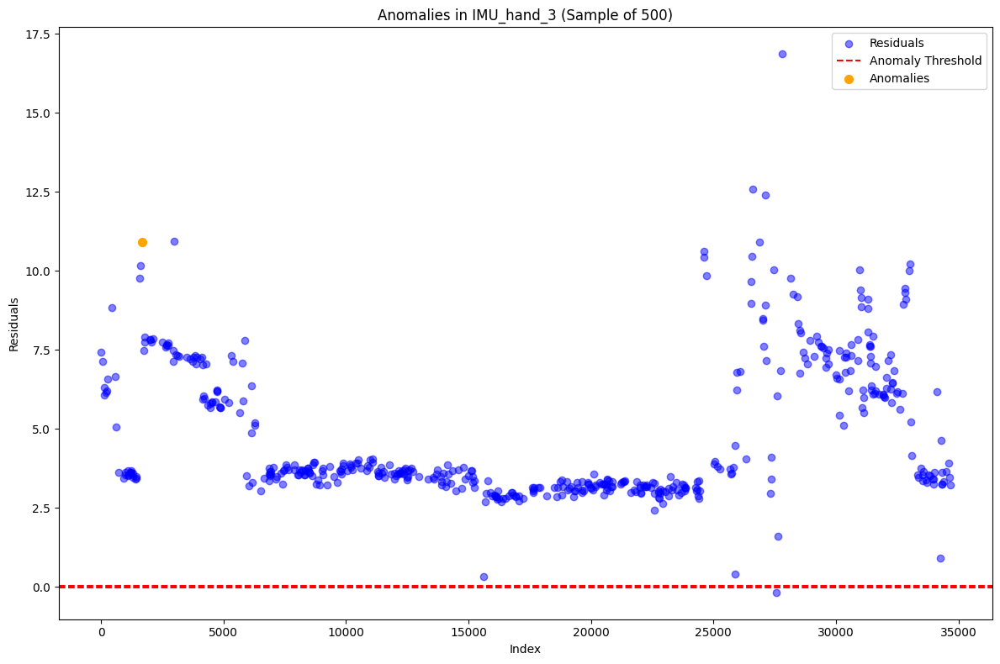

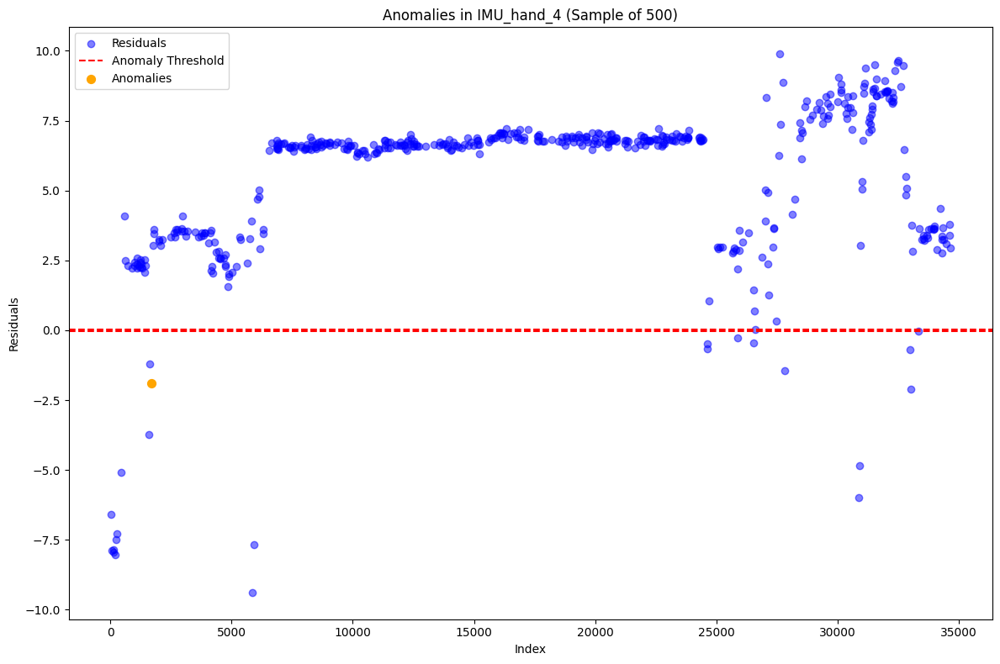

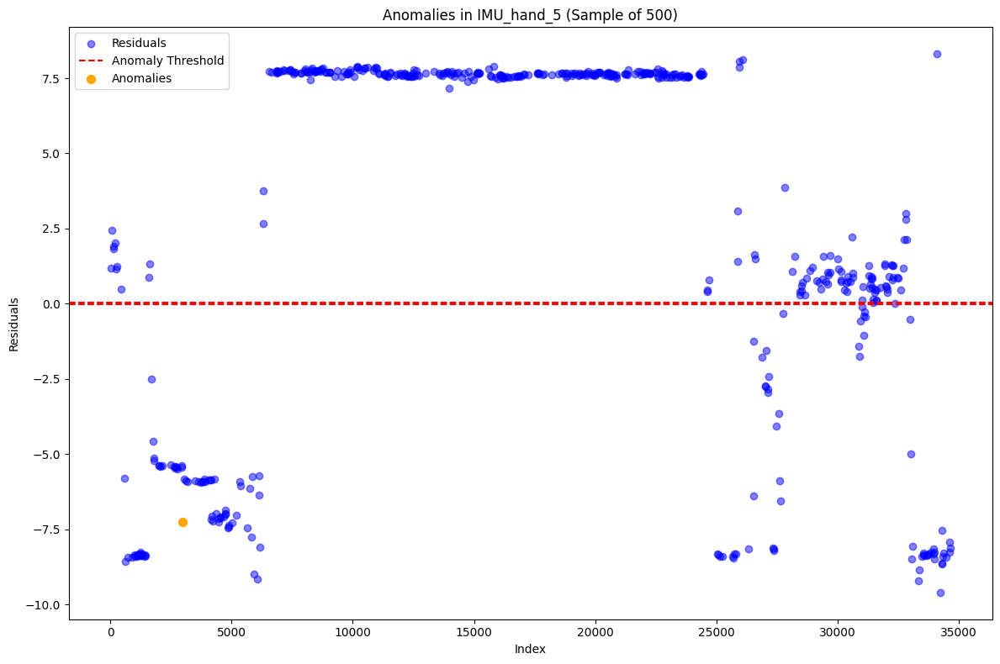

...

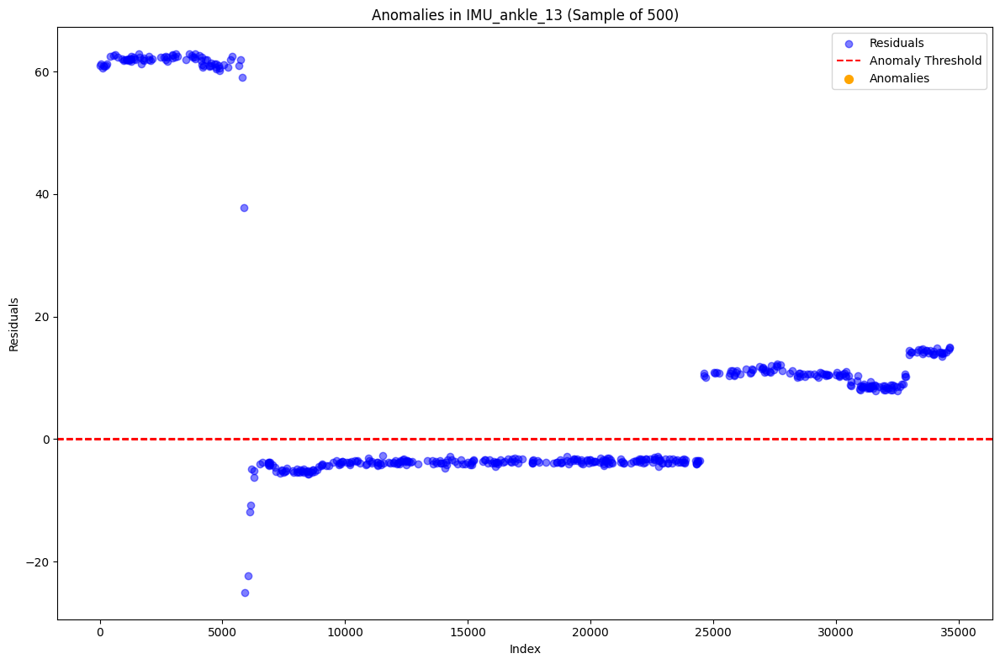

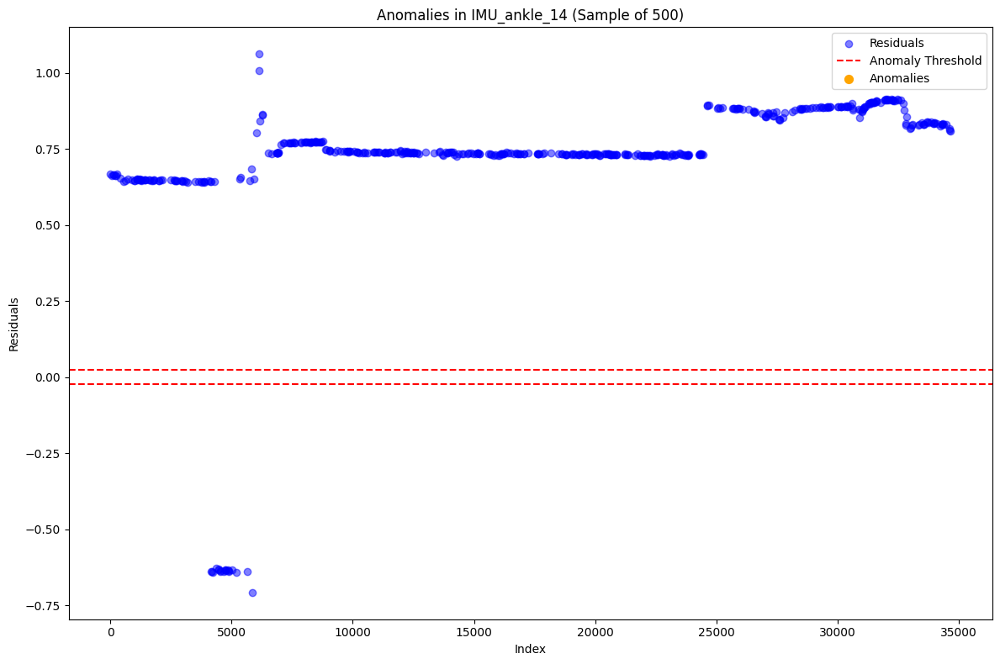

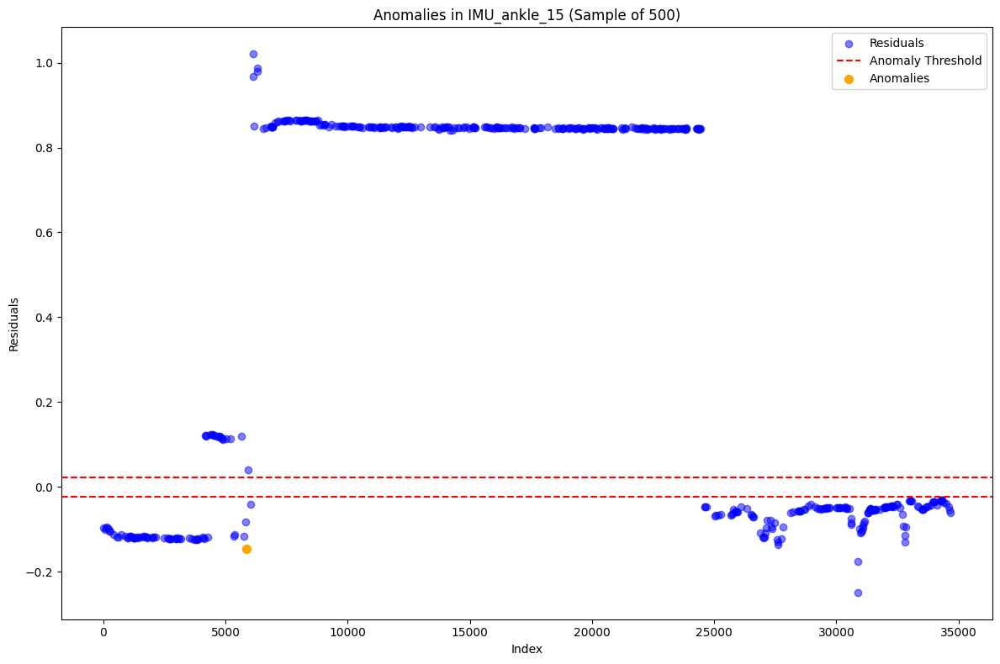

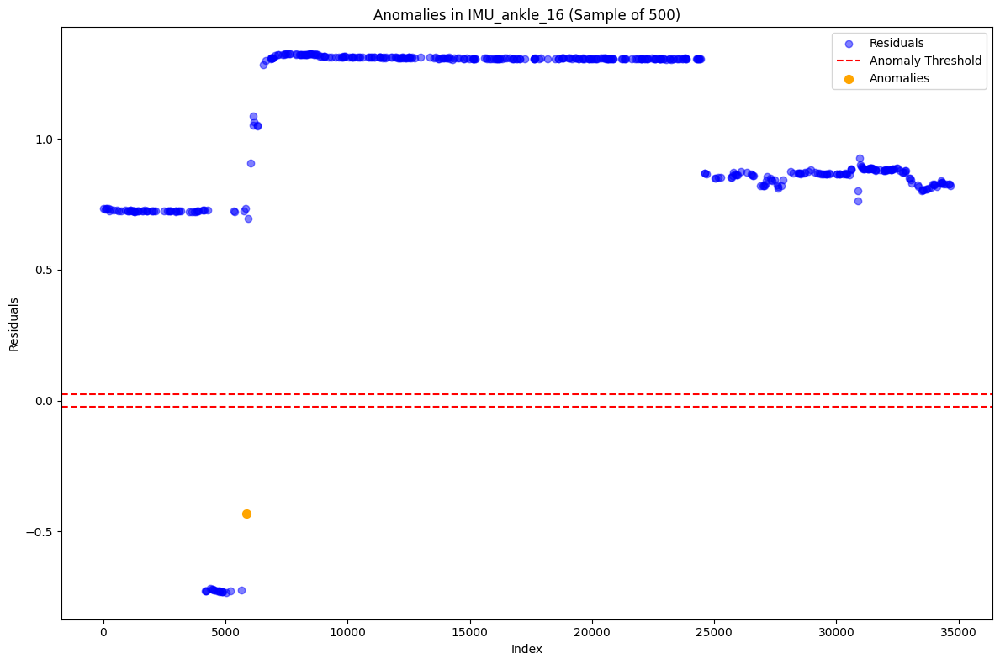

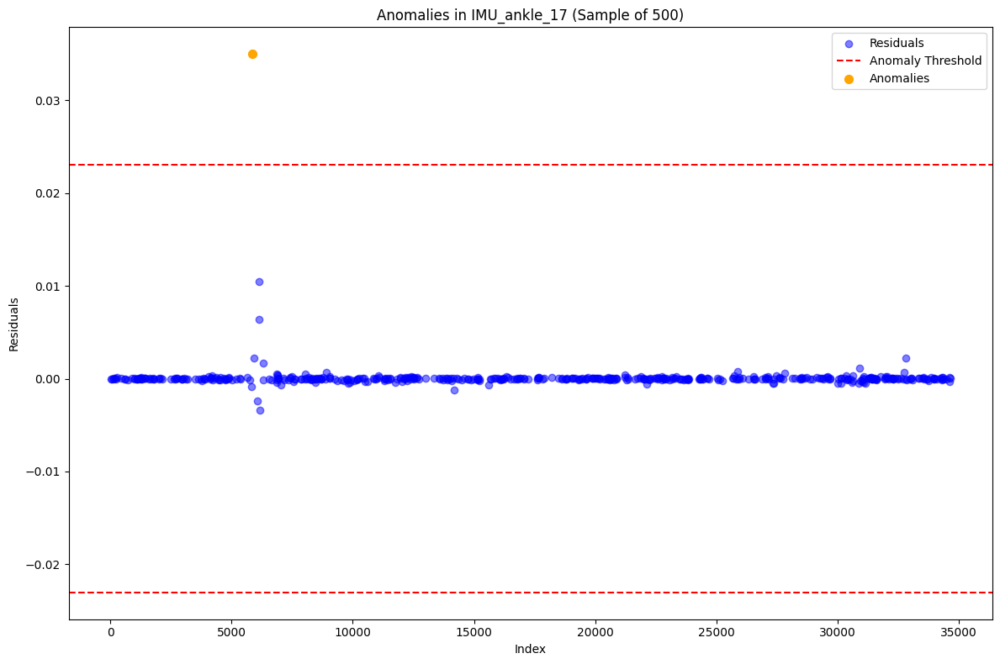

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the number of data points to plot for each column for better visibility
sample_size = 500  # Adjust based on dataset size

for target_col, indices in anomalies.items():
    if indices.size > 0:
        plt.figure(figsize=(12, 8))

        # Get residuals and sample for visibility
        residuals = y_test_full[target_col] - model.predict(X_test_full[trained_features])
        residuals_sample = residuals[:sample_size]
        indices_sample = indices[indices.isin(residuals_sample.index)]

        # Plot residuals as scatter points
        plt.scatter(residuals_sample.index, residuals_sample, color='blue', alpha=0.5, label='Residuals')
        plt.axhline(y=anomaly_threshold, color='red', linestyle='--', label='Anomaly Threshold')
        plt.axhline(y=-anomaly_threshold, color='red', linestyle='--')  # Lower threshold if symmetrical
        plt.scatter(indices_sample, residuals_sample[indices_sample], color='orange', s=50, label='Anomalies', marker='o')

        # Add titles and labels
        plt.title(f"Anomalies in {target_col} (Sample of {sample_size})")
        plt.xlabel("Index")
        plt.ylabel("Residuals")
        plt.legend()
        plt.tight_layout()
        plt.show()


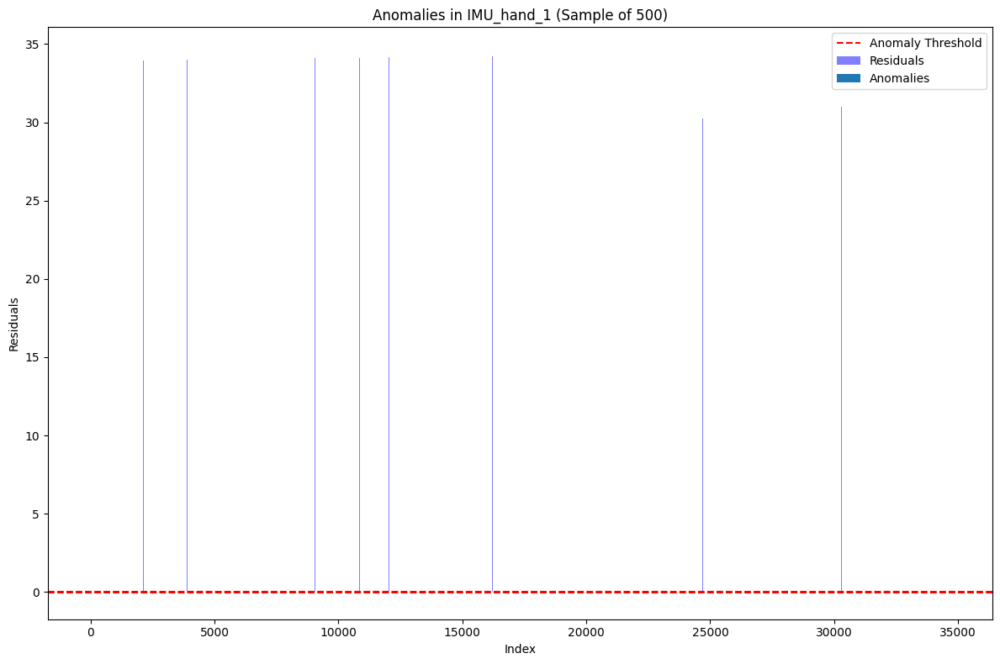

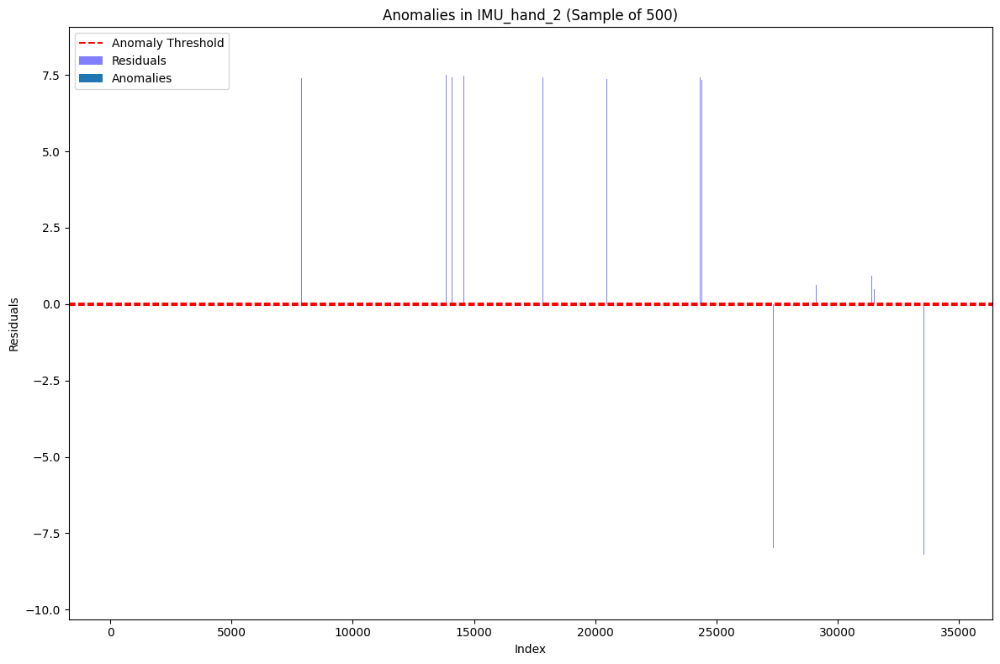

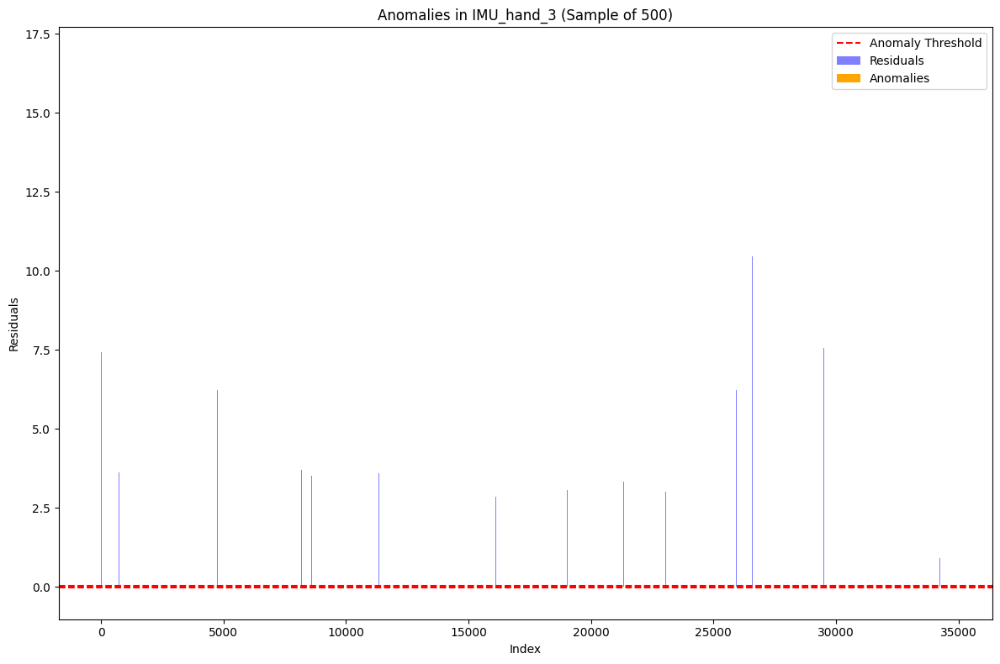

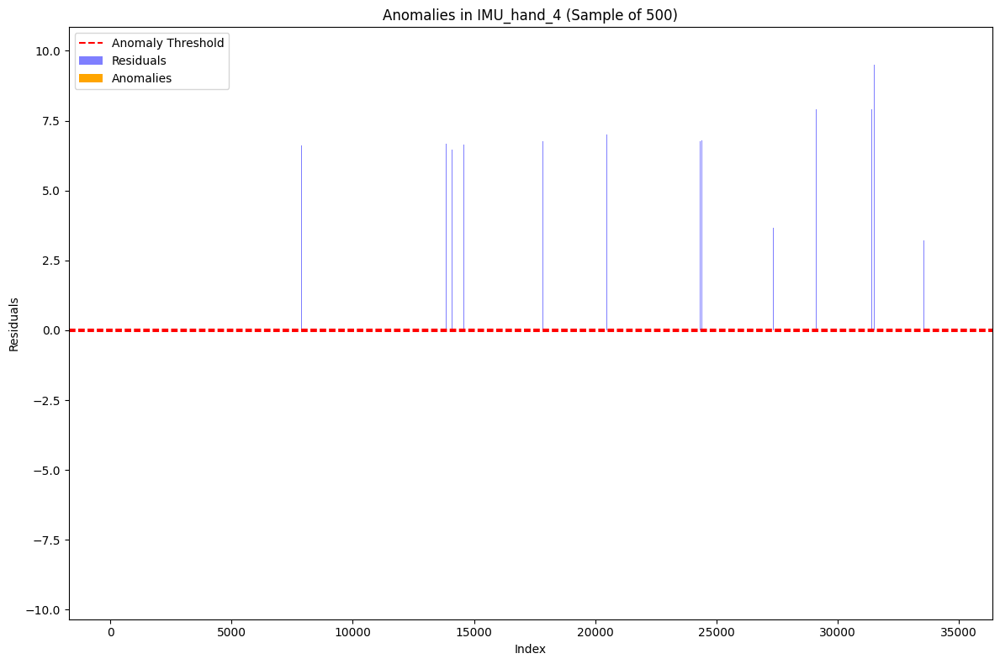

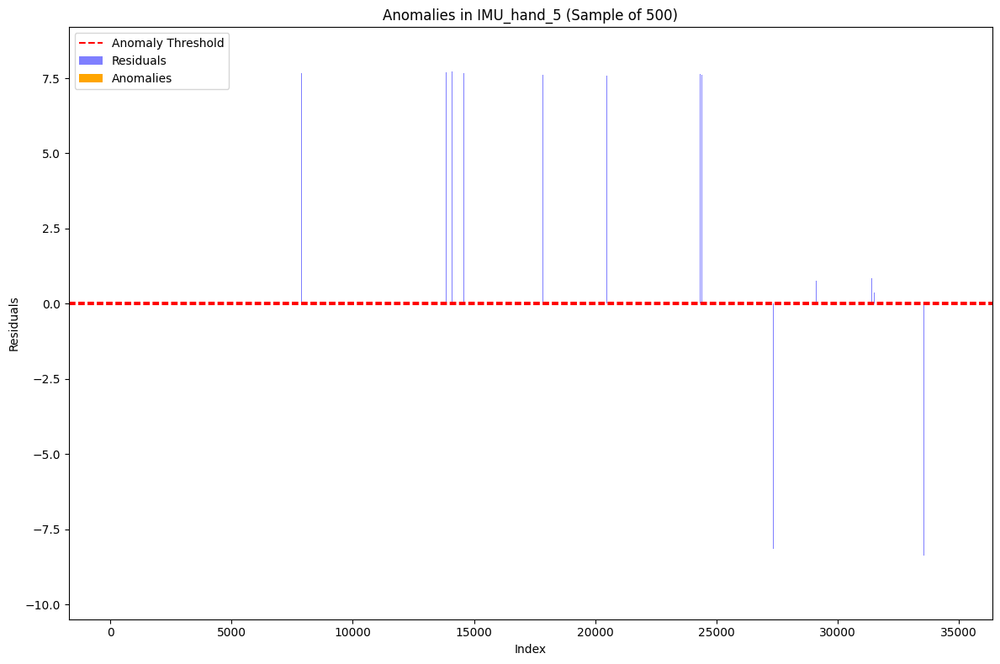

...

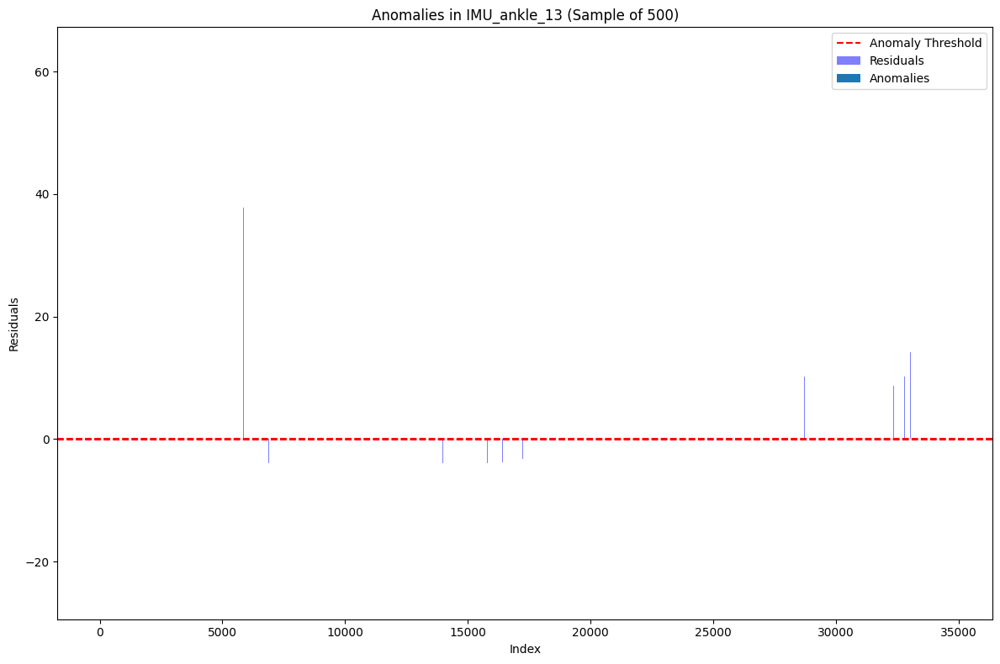

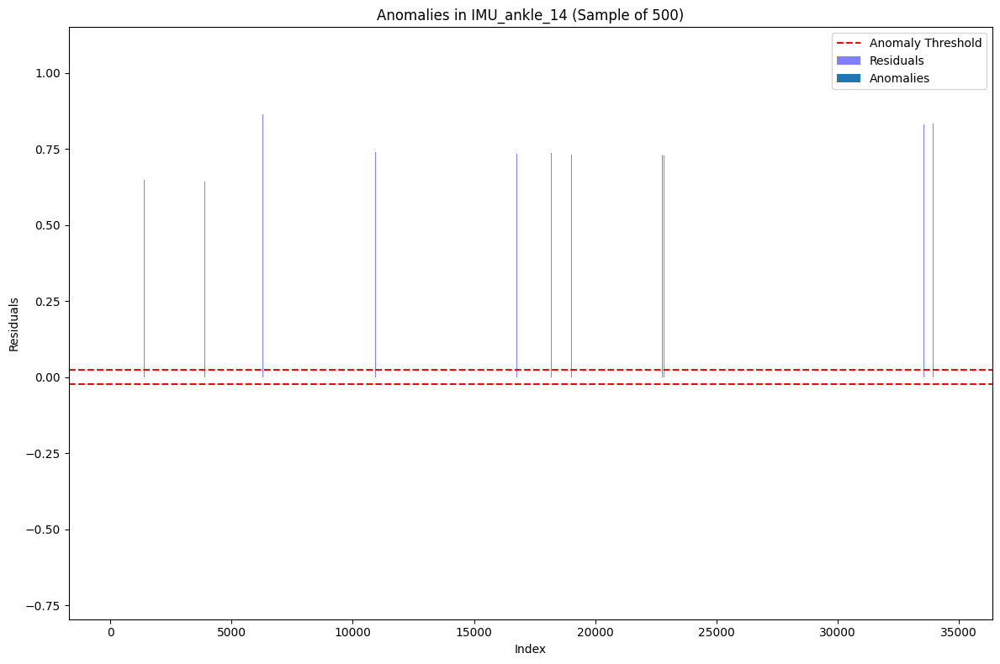

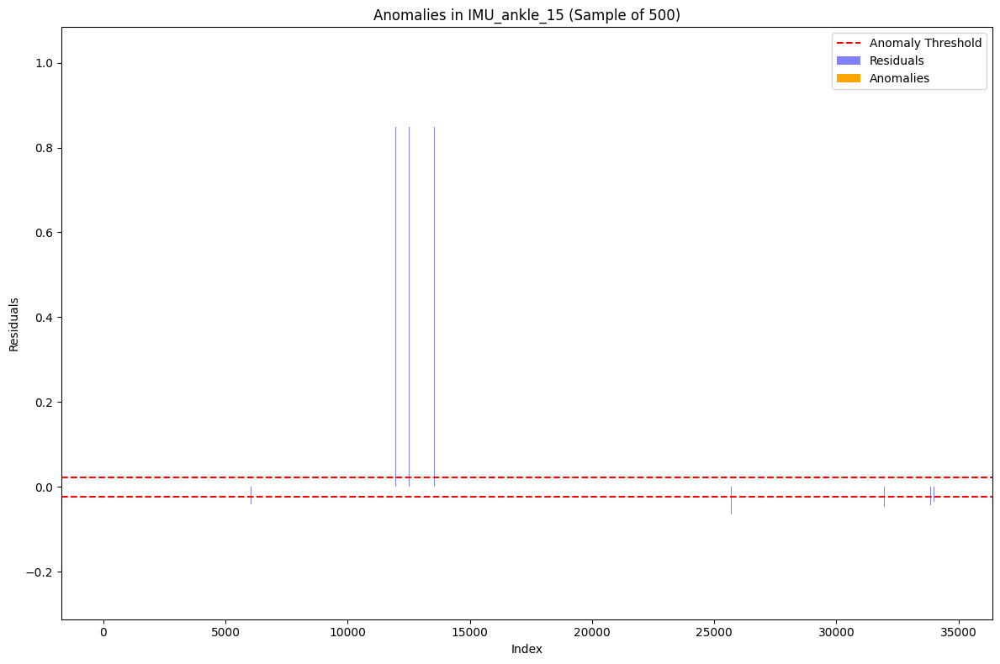

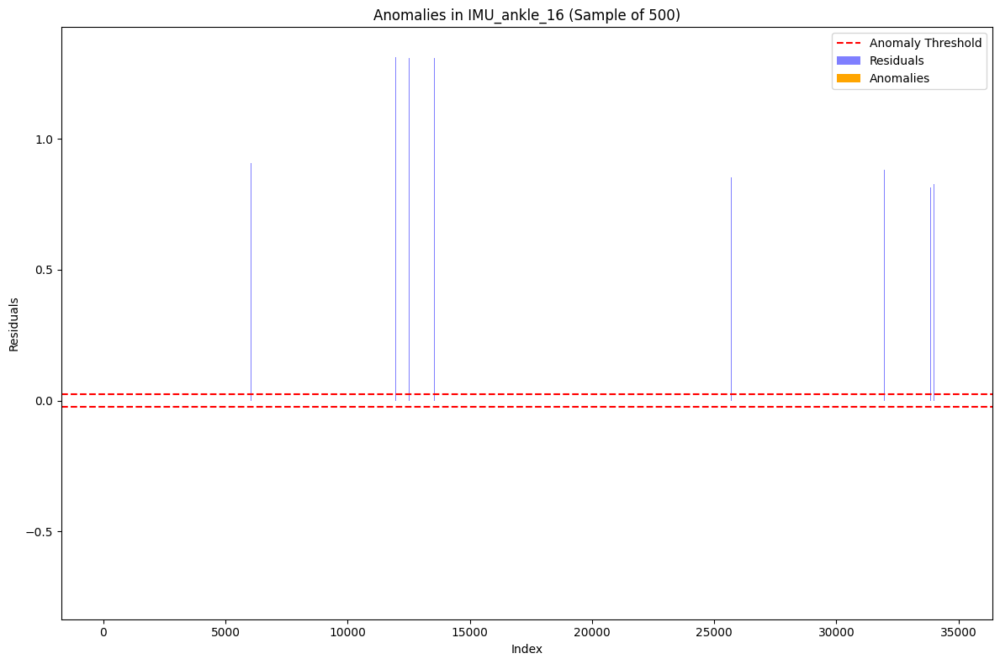

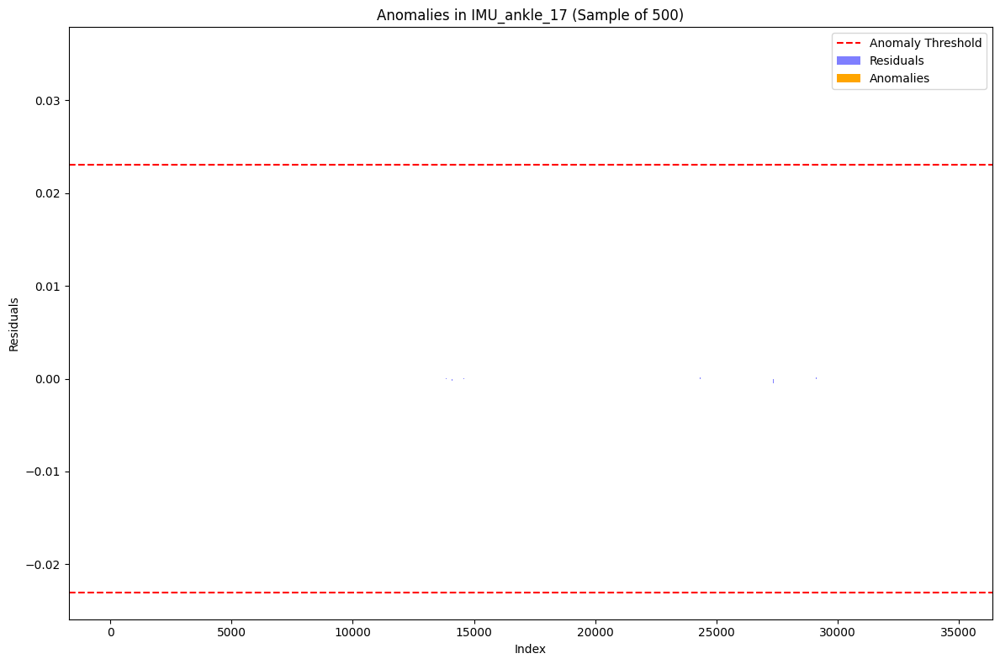

In [ ]:
import matplotlib.pyplot as plt

for target_col, indices in anomalies.items():
    if indices.size > 0:
        plt.figure(figsize=(12, 8))

        # Get residuals and sample for visibility
        residuals = y_test_full[target_col] - model.predict(X_test_full[trained_features])
        residuals_sample = residuals[:sample_size]
        indices_sample = indices[indices.isin(residuals_sample.index)]

        # Plot residuals as bars
        plt.bar(residuals_sample.index, residuals_sample, color='blue', alpha=0.5, label='Residuals')
        plt.axhline(y=anomaly_threshold, color='red', linestyle='--', label='Anomaly Threshold')
        plt.axhline(y=-anomaly_threshold, color='red', linestyle='--')  # Lower threshold if symmetrical
        plt.bar(indices_sample, residuals_sample[indices_sample], color='orange', label='Anomalies')

        # Add titles and labels
        plt.title(f"Anomalies in {target_col} (Sample of {sample_size})")
        plt.xlabel("Index")
        plt.ylabel("Residuals")
        plt.legend()
        plt.tight_layout()
        plt.show()


# **Predicting values**

In [ ]:
import pickle
import pandas as pd
import os

def load_model(model_path):
    """
    Loads a trained model from the given path.

    Args:
    - model_path (str): The path to the model file.

    Returns:
    - The trained model.
    """
    with open(model_path, "rb") as f:
        model = pickle.load(f)
    return model

def drop_unnecessary_columns(input_data, columns_to_drop):
    """
    Drops the unnecessary columns from the input data (e.g., activityID, timestamp).

    Args:
    - input_data (pd.DataFrame): The dataset with columns to drop.
    - columns_to_drop (list): A list of column names to drop from the input data.

    Returns:
    - pd.DataFrame: The dataset after dropping the unnecessary columns.
    """
    return input_data.drop(columns=columns_to_drop, errors='ignore')

def fill_missing_values(input_data, model_path="/content/modesl2", columns_to_drop=None):
    """
    Fills missing values in the input_data using the trained models for each column.

    Args:
    - input_data (pd.DataFrame): The dataset with missing values.
    - model_path (str): Path to the directory where models are stored (default: /content/model2).
    - columns_to_drop (list): List of columns to drop from the dataset (e.g., activityID, timestamp).

    Returns:
    - pd.DataFrame: The dataset with missing values filled.
    """
    if columns_to_drop is not None:
        input_data = drop_unnecessary_columns(input_data, columns_to_drop)

    filled_data = input_data.copy()
    print("Starting to fill missing values...")

    for column in input_data.columns:
        if input_data[column].isnull().sum() > 0:  # Check if column has missing values
            print(f"Filling missing values for column: {column}")
            try:
                # Load the trained model for this column from the model path
                model_file = os.path.join(model_path, f"RF_model_{column}.pkl")

                if os.path.exists(model_file):
                    model = load_model(model_file)

                    # Prepare the data without the target column for prediction
                    X_input = input_data.drop(columns=[column])

                    # Predict missing values for this column
                    missing_indices = input_data[column].isnull()
                    predictions = model.predict(X_input[missing_indices])

                    # Fill the missing values in the original data
                    filled_data.loc[missing_indices, column] = predictions
                    print(f"Filled missing values for {column}")
                else:
                    print(f"Model for column {column} not found in {model_path}")
            except Exception as e:
                print(f"Error while filling missing values for {column}: {e}")

    print("Completed filling missing values.")
    return filled_data

def save_filled_data(filled_data, output_file="filled_data.csv"):
    """
    Saves the filled data to a CSV file.

    Args:
    - filled_data (pd.DataFrame): The dataset with missing values filled.
    - output_file (str): The path where the filled data should be saved (default: "filled_data.csv").
    """
    filled_data.to_csv(output_file, index=False)
    print(f"Filled data saved to {output_file}")

def process_and_fill(input_file, model_path="/content/models2", output_file="filled_data.csv", columns_to_drop=None):
    """
    Takes a CSV file as input, fills missing values using trained models, and saves the filled data.

    Args:
    - input_file (str): Path to the input CSV file with missing values.
    - model_path (str): Path to the directory where models are stored (default: /content/models2).
    - output_file (str): Path where the filled data will be saved (default: "filled_data.csv").
    - columns_to_drop (list): List of columns to drop from the dataset (e.g., activityID, timestamp).
    """
    try:
        # Load the input data (CSV file)
        input_data = pd.read_csv('/content/combined_data.csv')
        print(f"Input data loaded from {input_file}")

        # Check if there are missing values in the dataset
        missing_values = input_data.isnull().sum().sum()
        if missing_values > 0:
            print(f"Dataset contains {missing_values} missing values.")
        else:
            print("No missing values in the dataset.")

        # Fill the missing values
        filled_data = fill_missing_values(input_data, model_path, columns_to_drop)

        # Save the filled data to a new CSV file
        save_filled_data(filled_data, output_file)

        output_file = "/content/filled_data.csv"  # Full path to the saved file in Google Colab or your local environment


    except Exception as e:
        print(f"Error processing the file {input_file}: {e}")

def main(input_file="/content/combined_data.csv", model_path="/content/models2", output_file="/content/filled_data.csv", columns_to_drop=None):
    """
    Main function to process the input file, fill missing values, and save the output file.
    """
    process_and_fill(input_file, model_path, output_file, columns_to_drop)

# Run the main function
main(input_file="/content/combined_data.csv", model_path="/content/models2", output_file="/content/filled_data.csv", columns_to_drop=["activityID", "timestamp"])


Input data loaded from /content/combined_data.csv
Dataset contains 125958 missing values.
Starting to fill missing values...
Filling missing values for column: heart_rate
Filled missing values for heart_rate
Filling missing values for column: IMU_hand_1
Filled missing values for IMU_hand_1
Filling missing values for column: IMU_hand_2
Filled missing values for IMU_hand_2
Filling missing values for column: IMU_hand_3
Filled missing values for IMU_hand_3
Filling missing values for column: IMU_hand_4
Filled missing values for IMU_hand_4
Filling missing values for column: IMU_hand_5
Filled missing values for IMU_hand_5
Filling missing values for column: IMU_hand_6
Filled missing values for IMU_hand_6
Filling missing values for column: IMU_hand_7
Filled missing values for IMU_hand_7
Filling missing values for column: IMU_hand_8
Filled missing values for IMU_hand_8
Filling missing values for column: IMU_hand_9
Filled missing values for IMU_hand_9
Filling missing values for column: IMU_hand_1

# **Anamoly detection**

In [ ]:
import pickle
import pandas as pd
import os

def load_model(model_path):
    """
    Loads a trained model from the given path.

    Args:
    - model_path (str): The path to the model file.

    Returns:
    - The trained model.
    """
    with open(model_path, "rb") as f:
        model = pickle.load(f)
    return model

def drop_unnecessary_columns(input_data, columns_to_drop):
    """
    Drops the unnecessary columns from the input data (e.g., activityID, timestamp).

    Args:
    - input_data (pd.DataFrame): The dataset with columns to drop.
    - columns_to_drop (list): A list of column names to drop from the input data.

    Returns:
    - pd.DataFrame: The dataset after dropping the unnecessary columns.
    """
    return input_data.drop(columns=columns_to_drop, errors='ignore')

def detect_anomalies(input_data, model_path="/content/models2", columns_to_drop=None, threshold=0.1):
    """
    Detects anomalies in the input_data by comparing actual values with predicted values.

    Args:
    - input_data (pd.DataFrame): The dataset to check for anomalies.
    - model_path (str): Path to the directory where models are stored (default: /content/models2).
    - columns_to_drop (list): List of columns to drop from the dataset (e.g., activityID, timestamp).
    - threshold (float): The threshold for anomaly detection, expressed as a percentage of the actual value (default: 0.1 for 10%).

    Returns:
    - pd.DataFrame: The dataset with anomalies flagged and predicted values.
    - list: List of anomalies with cell number, anomaly value, and predicted value.
    """
    if columns_to_drop is not None:
        input_data = drop_unnecessary_columns(input_data, columns_to_drop)

    anomaly_details = []  # List to store anomaly information
    output_data = input_data.copy()  # Copy of input data for modification

    for column in input_data.columns:
        if input_data[column].isnull().sum() > 0 or input_data[column].notnull().sum() > 0:  # Check if column has missing values or values to check
            try:
                # Load the trained model for this column from the model path
                model_file = os.path.join(model_path, f"RF_model_{column}.pkl")

                if os.path.exists(model_file):
                    model = load_model(model_file)

                    # Prepare the data without the target column for prediction
                    X_input = input_data.drop(columns=[column])

                    # Predict the values for the column
                    predictions = model.predict(X_input)

                    # Check for anomalies (discrepancy between actual and predicted values)
                    for idx, actual_value in input_data[column].items():  # Use items() instead of itertiems
                        predicted_value = predictions[idx]

                        # Calculate the absolute difference
                        diff = abs(actual_value - predicted_value)

                        # Define the threshold (percentage of actual value)
                        threshold_value = threshold * actual_value  # Threshold as a percentage of the actual value

                        if diff > threshold_value:  # Anomaly detected if difference exceeds the threshold
                            anomaly_details.append({
                                'row': idx,
                                'column': column,
                                'anomaly_value': actual_value,
                                'predicted_value': predicted_value
                            })
                            output_data.loc[idx, column] = predicted_value  # Replace anomaly with predicted value

                else:
                    print(f"Model for column {column} not found in {model_path}")
            except Exception as e:
                print(f"Error while detecting anomalies for {column}: {e}")

    return output_data, anomaly_details


def save_anomaly_results(output_data, anomaly_details, output_file="filled_data_with_anomalies.csv"):
    """
    Saves the filled data with anomalies to a CSV file and saves the anomaly details to another file.

    Args:
    - output_data (pd.DataFrame): The dataset with anomalies flagged and filled.
    - anomaly_details (list): The list of anomalies with row index, column name, anomaly value, and predicted value.
    - output_file (str): The path where the filled data with anomalies should be saved.
    """
    output_data.to_csv(output_file, index=False)
    print(f"Filled data with anomalies saved to {output_file}")

    # Save anomaly details to a CSV
    anomaly_df = pd.DataFrame(anomaly_details)
    anomaly_df.to_csv("anomalies_detected.csv", index=False)
    print("Anomalies details saved to anomalies_detected.csv")

def process_and_detect_anomalies(input_file, model_path="/content/models2", output_file="filled_data_with_anomalies.csv", columns_to_drop=None):
    """
    Takes a CSV file as input, detects anomalies, fills missing values using trained models, and saves the filled data and anomaly details.

    Args:
    - input_file (str): Path to the input CSV file with missing values.
    - model_path (str): Path to the directory where models are stored (default: /content/models2).
    - output_file (str): Path where the filled data with anomalies will be saved (default: "filled_data_with_anomalies.csv").
    - columns_to_drop (list): List of columns to drop from the dataset (e.g., activityID, timestamp).
    """
    try:
        # Load the input data (CSV file)
        input_data = pd.read_csv(input_file)
        print(f"Input data loaded from {input_file}")

        # Detect anomalies and fill missing values
        output_data, anomaly_details = detect_anomalies(input_data, model_path, columns_to_drop)

        # Save the filled data and anomalies to CSV
        save_anomaly_results(output_data, anomaly_details, output_file)

    except Exception as e:
        print(f"Error processing the file {input_file}: {e}")

def main(input_file="/content/combined_data.csv", model_path="/content/models2", output_file="/content/filled_data_with_anomalies.csv", columns_to_drop=None):
    """
    Main function to process the input file, detect anomalies, fill missing values, and save the output file.
    """
    process_and_detect_anomalies(input_file, model_path, output_file, columns_to_drop)

# Run the main function
main(input_file="/content/combined_data.csv", model_path="/content/models2", output_file="/content/filled_data_with_anomalies.csv", columns_to_drop=["activityID", "timestamp"])


Input data loaded from /content/combined_data.csv
Filled data with anomalies saved to /content/filled_data_with_anomalies.csv
Anomalies details saved to anomalies_detected.csv
